# **From Price Cuts to Profit Gains: A Machine Learning Approach to Revenue Optimization**

## **Import Library**

In [7]:
# Install library yang dibutuhkan
!pip install scipy
!pip install dalex
!pip install shap
!pip install lime
!pip install catboost

In [8]:
# load pandas untuk data wrangling
import pandas as pd
# load numpy untuk manipulasi vektor
import numpy as np
# load matplotlib untuk visualisasi data
import matplotlib.pyplot as plt
# load seaborn untuk visualisasi data
import seaborn as sns

# load metrics object dari sklearn
from sklearn import metrics
# load train-test data splitter
from sklearn.model_selection import train_test_split
# load scaler
from sklearn.preprocessing import StandardScaler
# load encoder
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
# load model catboost
from catboost import CatBoostRegressor
# load model regresi linier dan regularisasi
from sklearn.linear_model import LinearRegression, Ridge, Lasso
# load decison tree regression
from sklearn.tree import DecisionTreeRegressor
# load random forest dan gradient boosting
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
# load MLP Regressor
from sklearn.neural_network import MLPRegressor
# load metrik untuk regresi
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# load xgboost
import xgboost as xgb
# load lightbgm
import lightgbm as lgb
# load GridSearchCV
from sklearn.model_selection import GridSearchCV

# load dalex untuk interpretability
import dalex as dx

# load warnings
import warnings

%matplotlib inline
warnings.filterwarnings("ignore")
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

## **Load Dataset**

In [9]:
df = pd.read_csv(r"C:\Users\Fitri Wulan Darojati\Documents\Data Science\Project\Markdown Optimization\retail_markdown.csv")

## **Overview Data**

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43750 entries, 0 to 43749
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Product_ID          43750 non-null  int64  
 1   Category            43750 non-null  object 
 2   Brand               43750 non-null  object 
 3   Season              43750 non-null  object 
 4   Product_Name        43750 non-null  object 
 5   Original_Price      43750 non-null  float64
 6   Competitor_Price    43750 non-null  float64
 7   Seasonality_Factor  43750 non-null  float64
 8   Markdown_1          43750 non-null  float64
 9   Markdown_2          43750 non-null  float64
 10  Markdown_3          43750 non-null  float64
 11  Markdown_4          43750 non-null  float64
 12  Historical_Sales    43750 non-null  int64  
 13  Sales_After_M1      43750 non-null  int64  
 14  Sales_After_M2      43750 non-null  int64  
 15  Sales_After_M3      43750 non-null  int64  
 16  Sale

In [11]:
# Mengubah Tipe Data

df['Product_ID'] = df['Product_ID'].astype('object')

In [12]:
df.head()

,Product_ID,Category,Brand,Season,Product_Name,Original_Price,Competitor_Price,Seasonality_Factor,Markdown_1,Markdown_2,Markdown_3,Markdown_4,Historical_Sales,Sales_After_M1,Sales_After_M2,Sales_After_M3,Sales_After_M4,Stock_Level,Promotion_Type,Customer Ratings,Return Rate,Optimal Discount
0,1,Skincare,BrandA,Summer,Sunscreen,70.39,70.98,1.71,0.31,0.49,0.18,0.48,344,404,540,650,979,183,In-Store,4.9,1.97,0.36
1,2,Skincare,BrandB,Rainy,Eye Cream,55.35,56.58,0.85,0.39,0.21,0.10,0.46,98,107,116,118,143,142,Online,4.0,2.57,0.29
2,3,Skincare,BrandA,Spring,Face Mist,26.16,28.54,1.03,0.17,0.43,0.30,0.43,72,72,87,84,84,112,Social Media,2.3,4.64,0.33
3,4,Bodycare,BrandD,Winter,Shower Gel,99.34,98.57,1.91,0.20,0.21,0.13,0.47,243,281,316,361,539,57,In-Store,4.9,1.42,0.25
4,5,Skincare,BrandA,Winter,Peeling Gel,60.33,61.05,1.65,0.14,0.20,0.21,0.36,251,289,325,402,534,125,In-Store,4.6,1.36,0.23


In [13]:
# statistical summary dari kesuluruhan dataset
df.describe()

,Original_Price,Competitor_Price,Seasonality_Factor,Markdown_1,Markdown_2,Markdown_3,Markdown_4,Historical_Sales,Sales_After_M1,Sales_After_M2,Sales_After_M3,Sales_After_M4,Stock_Level,Customer Ratings,Return Rate,Optimal Discount
count,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000,43750.000000
mean,52.659917,53.648610,1.328372,0.250620,0.350107,0.199834,0.400097,171.893554,201.142171,250.353897,286.513623,370.565303,124.854469,4.290862,2.203713,0.300373
std,27.515733,27.542159,0.466122,0.086428,0.086604,0.057907,0.057977,88.500750,111.765796,152.876420,184.139572,258.253190,43.211560,0.810869,1.258030,0.036854
min,5.000000,4.100000,0.500000,0.100000,0.200000,0.100000,0.300000,26.000000,26.000000,25.000000,26.000000,25.000000,50.000000,2.000000,1.000000,0.180000
25%,28.820000,29.800000,0.900000,0.180000,0.280000,0.150000,0.350000,101.000000,113.000000,128.000000,137.000000,152.000000,88.000000,4.000000,1.360000,0.280000
50%,52.840000,53.835000,1.500000,0.250000,0.350000,0.200000,0.400000,154.000000,175.000000,210.000000,236.000000,299.000000,124.000000,4.600000,1.720000,0.300000
75%,76.630000,77.597500,1.750000,0.330000,0.430000,0.250000,0.450000,233.000000,276.000000,357.000000,415.000000,555.000000,162.000000,4.800000,2.600000,0.320000
max,100.000000,102.960000,2.000000,0.400000,0.500000,0.300000,0.500000,416.000000,579.000000,844.000000,1114.000000,1535.000000,200.000000,5.000000,6.000000,0.420000


In [14]:
df.describe(include='object')

,Product_ID,Category,Brand,Season,Product_Name,Promotion_Type
count,43750,43750,43750,43750,43750,43750
unique,43400,3,6,4,59,3
top,11592,Skincare,BrandC,Spring,Vitamin C Serum,In-Store
freq,2,19681,7425,11084,1085,14736


In [15]:
# membuat copy dari raw dataset
dfc = df.copy()

### Check Missing Value

In [16]:
df.isna().sum()

Product_ID            0
Category              0
Brand                 0
Season                0
Product_Name          0
Original_Price        0
Competitor_Price      0
Seasonality_Factor    0
Markdown_1            0
Markdown_2            0
Markdown_3            0
Markdown_4            0
Historical_Sales      0
Sales_After_M1        0
Sales_After_M2        0
Sales_After_M3        0
Sales_After_M4        0
Stock_Level           0
Promotion_Type        0
Customer Ratings      0
Return Rate           0
Optimal Discount      0
dtype: int64

In [17]:
cat = df.select_dtypes(include=['object']).columns

for column in cat:
    print(f"============= {column} =================")
    display(df[column].value_counts())
    print()

============= Product_ID =================


Product_ID
11592    2
8791     2
18295    2
20171    2
14799    2
17737    2
4933     2
6522     2
18966    2
17395    2
13798    2
8340     2
2768     2
18091    2
355      2
14928    2
16398    2
4385     2
6401     2
19152    2
4244     2
15166    2
3520     2
18715    2
9987     2
2005     2
19004    2
19459    2
19319    2
5355     2
18799    2
17578    2
14876    2
7290     2
9037     2
17613    2
15878    2
16619    2
17713    2
16225    2
10501    2
17221    2
19580    2
12608    2
16228    2
2339     2
13005    2
1708     2
10309    2
10798    2
15885    2
8940     2
13316    2
3105     2
6810     2
6936     2
15986    2
9164     2
17715    2
4278     2
13467    2
15126    2
12373    2
4565     2
4705     2
18153    2
19870    2
7679     2
2361     2
14166    2
8495     2
1571     2
15517    2
749      2
9063     2
17988    2
9282     2
19648    2
5926     2
13618    2
21532    2
14895    2
11193    2
11551    2
13478    2
4860     2
11196    2
17340    2
6066     2
430      2


============= Category =================


Category
Skincare    19681
Bodycare    13134
Makeup      10935
Name: count, dtype: int64


============= Brand =================


Brand
BrandC    7425
BrandD    7350
BrandF    7307
BrandA    7297
BrandB    7247
BrandE    7124
Name: count, dtype: int64


============= Season =================


Season
Spring    11084
Winter    10942
Summer    10864
Rainy     10860
Name: count, dtype: int64


============= Product_Name =================


Product_Name
Vitamin C Serum         1085
Anti-Aging Cream        1084
Pore Minimizer          1077
Face Toner              1075
Face Serum              1067
Hydrating Serum         1065
Acne Treatment Gel      1051
Facial Essence          1037
Sunscreen               1037
Eye Cream               1031
Face Mist               1027
Makeup Remover          1020
Hydrating Mask          1017
Face Oil                1014
Brightening Cream       1012
Peeling Gel             1006
Night Cream             1004
Exfoliating Scrub        995
Facial Cleanser          977
Deodorant                698
Body Wash                696
Shaving Gel              691
After-Sun Lotion         682
Body Scrub               674
Anti-Cellulite Cream     671
Foot Cream               670
Body Lotion              664
Body Cream               662
Body Balm                662
Stretch Mark Cream       653
Shower Gel               645
Exfoliating Gloves       645
Foot Scrub               643
Hand Cream               641
B


============= Promotion_Type =================


Promotion_Type
In-Store        14736
Social Media    14522
Online          14492
Name: count, dtype: int64

No missing value and weird data.

### Check Duplicate

In [18]:
df.duplicated().sum()

np.int64(350)

Terdapat 350 row yang merupakan duplikat. Data duplikat akan langsung di-drop.

In [19]:
duplicates = df[df.duplicated(keep=False)]
duplicates

,Product_ID,Category,Brand,Season,Product_Name,Original_Price,Competitor_Price,Seasonality_Factor,Markdown_1,Markdown_2,Markdown_3,Markdown_4,Historical_Sales,Sales_After_M1,Sales_After_M2,Sales_After_M3,Sales_After_M4,Stock_Level,Promotion_Type,Customer Ratings,Return Rate,Optimal Discount
261,262,Makeup,BrandD,Spring,Highlighter,30.16,30.22,1.63,0.34,0.31,0.24,0.43,324,383,469,549,688,71,In-Store,4.7,1.35,0.33
354,355,Bodycare,BrandF,Winter,Foot Cream,69.23,68.68,1.76,0.36,0.33,0.12,0.32,113,155,187,203,275,60,In-Store,4.5,1.84,0.28
429,430,Makeup,BrandC,Winter,Eyeshadow Palette,11.98,12.95,1.78,0.37,0.48,0.27,0.35,214,280,351,408,482,106,In-Store,4.7,1.61,0.37
748,749,Makeup,BrandE,Rainy,Eyeliner,53.56,53.03,0.92,0.37,0.32,0.20,0.45,121,137,140,137,156,157,In-Store,4.0,3.13,0.34
1000,1001,Skincare,BrandF,Rainy,Peeling Gel,40.72,42.82,0.72,0.21,0.45,0.10,0.42,150,154,174,172,166,146,In-Store,3.6,2.65,0.30
1121,1122,Skincare,BrandB,Spring,Night Cream,89.83,90.56,1.09,0.34,0.36,0.30,0.41,74,76,87,85,100,174,Online,4.3,2.60,0.35
1139,1140,Bodycare,BrandE,Spring,Body Butter,13.32,13.50,1.09,0.32,0.44,0.22,0.34,199,196,210,221,257,102,Social Media,5.0,1.81,0.33
1484,1485,Skincare,BrandA,Spring,Sunscreen,7.01,7.57,1.30,0.17,0.32,0.18,0.41,256,248,262,273,297,73,Online,4.5,1.91,0.27
1487,1488,Skincare,BrandC,Spring,Brightening Cream,48.68,51.28,1.28,0.19,0.41,0.20,0.47,100,97,116,116,138,133,Online,3.3,2.76,0.32
1570,1571,Bodycare,BrandE,Rainy,Deodorant,85.26,84.32,1.07,0.15,0.49,0.18,0.30,116,125,190,211,246,87,Social Media,4.9,1.89,0.28


In [20]:
# Drop duplicates
df = df.drop_duplicates()

In [21]:
df.duplicated().sum()

np.int64(0)

No more duplicated data.

### Add New Feature

In [22]:
df['Discounted_Price_M1'] = df['Original_Price'] * (1 - df['Markdown_1'])
df['Discounted_Price_M2'] = df['Original_Price'] * (1 - df['Markdown_2'])
df['Discounted_Price_M3'] = df['Original_Price'] * (1 - df['Markdown_3'])
df['Discounted_Price_M4'] = df['Original_Price'] * (1 - df['Markdown_4'])

In [23]:
df['Price_per_Stock'] = df['Original_Price'] / (df['Stock_Level'] + 1)
df['Price_Gap_Competitor'] = df['Original_Price'] - df['Competitor_Price']
df['Price_Gap_Percent'] = df['Price_Gap_Competitor'] / df['Competitor_Price']

In [24]:
df.head()

,Product_ID,Category,Brand,Season,Product_Name,Original_Price,Competitor_Price,Seasonality_Factor,Markdown_1,Markdown_2,Markdown_3,Markdown_4,Historical_Sales,Sales_After_M1,Sales_After_M2,Sales_After_M3,Sales_After_M4,Stock_Level,Promotion_Type,Customer Ratings,Return Rate,Optimal Discount,Discounted_Price_M1,Discounted_Price_M2,Discounted_Price_M3,Discounted_Price_M4,Price_per_Stock,Price_Gap_Competitor,Price_Gap_Percent
0,1,Skincare,BrandA,Summer,Sunscreen,70.39,70.98,1.71,0.31,0.49,0.18,0.48,344,404,540,650,979,183,In-Store,4.9,1.97,0.36,48.5691,35.8989,57.7198,36.6028,0.382554,-0.59,-0.008312
1,2,Skincare,BrandB,Rainy,Eye Cream,55.35,56.58,0.85,0.39,0.21,0.10,0.46,98,107,116,118,143,142,Online,4.0,2.57,0.29,33.7635,43.7265,49.8150,29.8890,0.387063,-1.23,-0.021739
2,3,Skincare,BrandA,Spring,Face Mist,26.16,28.54,1.03,0.17,0.43,0.30,0.43,72,72,87,84,84,112,Social Media,2.3,4.64,0.33,21.7128,14.9112,18.3120,14.9112,0.231504,-2.38,-0.083392
3,4,Bodycare,BrandD,Winter,Shower Gel,99.34,98.57,1.91,0.20,0.21,0.13,0.47,243,281,316,361,539,57,In-Store,4.9,1.42,0.25,79.4720,78.4786,86.4258,52.6502,1.712759,0.77,0.007812
4,5,Skincare,BrandA,Winter,Peeling Gel,60.33,61.05,1.65,0.14,0.20,0.21,0.36,251,289,325,402,534,125,In-Store,4.6,1.36,0.23,51.8838,48.2640,47.6607,38.6112,0.478810,-0.72,-0.011794


### **Overall EDA**

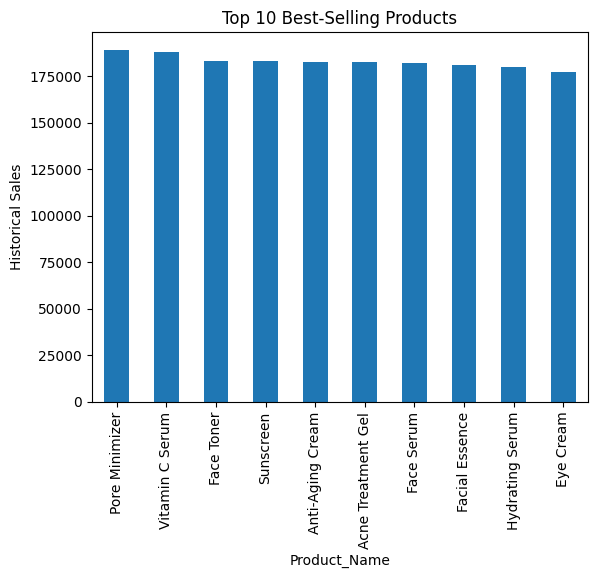

In [25]:
# 1. Top 10 produk paling laris
top_products = df.groupby('Product_Name')['Historical_Sales'].sum().sort_values(ascending=False).head(10)
top_products.plot(kind='bar', title='Top 10 Best-Selling Products')
plt.ylabel('Historical Sales')
plt.show()

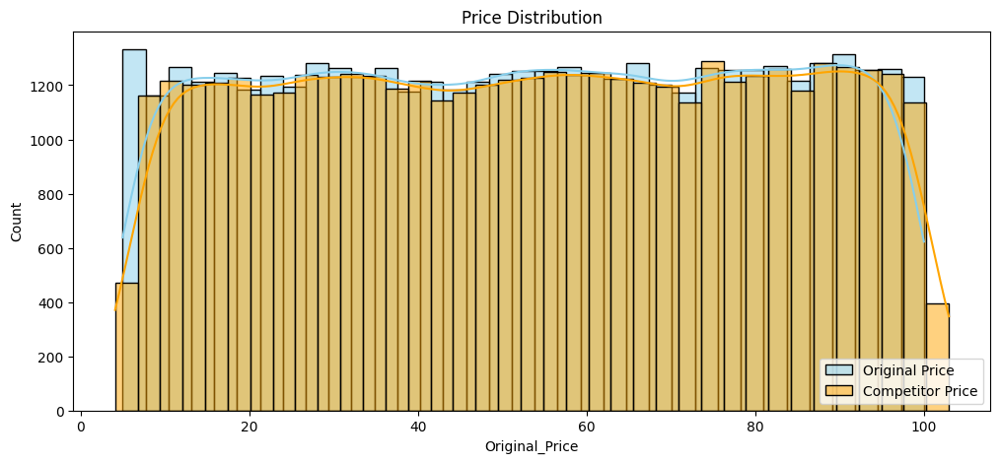

In [26]:
# 2. Distribusi harga
plt.figure(figsize=(12,5))
sns.histplot(df['Original_Price'], kde=True, color='skyblue', label='Original Price')
sns.histplot(df['Competitor_Price'], kde=True, color='orange', label='Competitor Price')
plt.title('Price Distribution')
plt.legend()
plt.show()

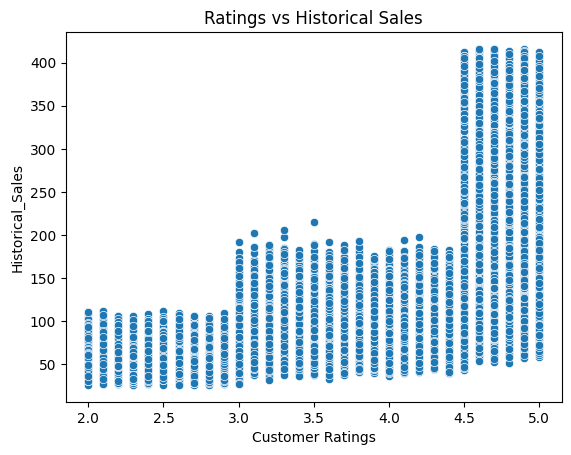

In [27]:
# 3. Rating vs Sales
sns.scatterplot(data=df, x='Customer Ratings', y='Historical_Sales')
plt.title('Ratings vs Historical Sales')
plt.show()

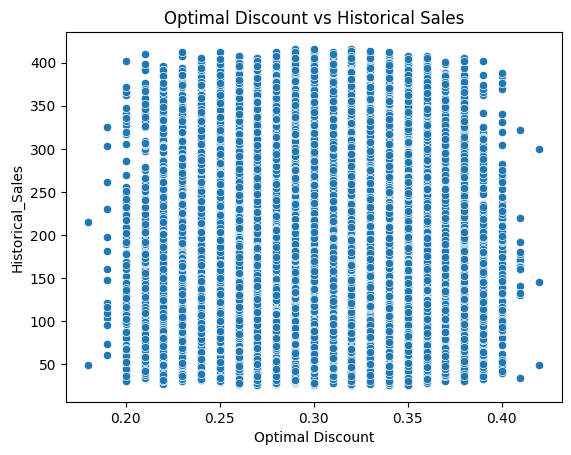

In [28]:
# 4. Korelasi Optimal Discount & Sales
sns.scatterplot(data=df, x='Optimal Discount', y='Historical_Sales')
plt.title('Optimal Discount vs Historical Sales')
plt.show()

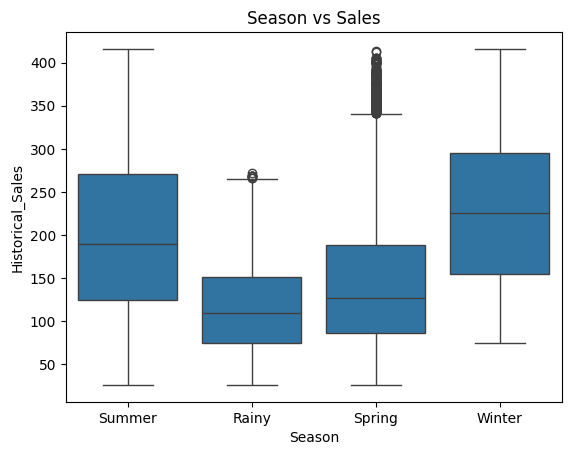

In [29]:
# 5. Musim dan Sales
sns.boxplot(data=df, x='Season', y='Historical_Sales')
plt.title('Season vs Sales')
plt.show()

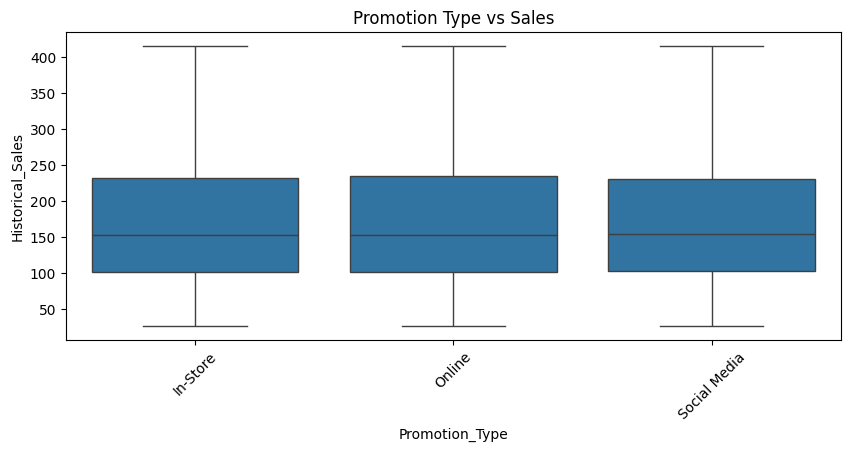

In [30]:
# 6. Promo Type dan Sales
plt.figure(figsize=(10,4))
sns.boxplot(data=df, x='Promotion_Type', y='Historical_Sales')
plt.title('Promotion Type vs Sales')
plt.xticks(rotation=45)
plt.show()

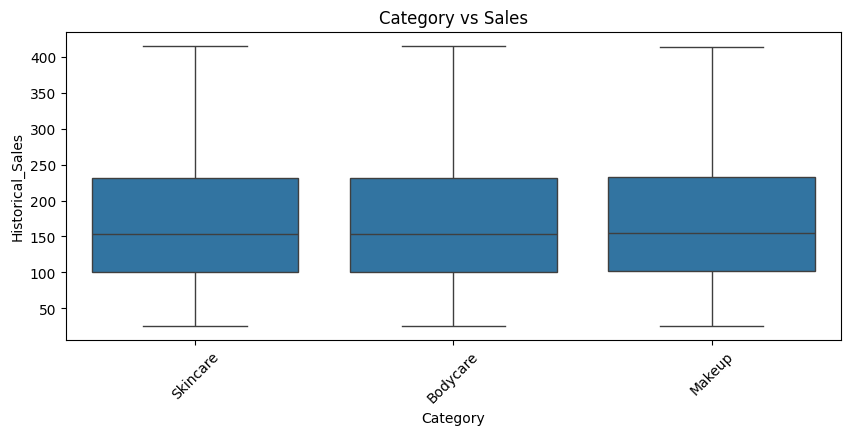

In [31]:
# 7. Category dan Sales
plt.figure(figsize=(10,4))
sns.boxplot(data=df, x='Category', y='Historical_Sales')
plt.title('Category vs Sales')
plt.xticks(rotation=45)
plt.show()

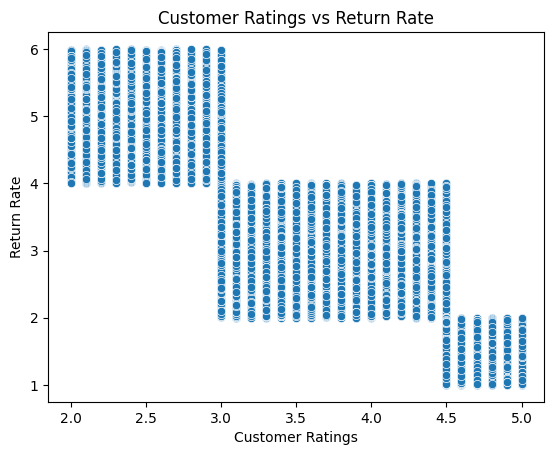

In [32]:
# 8. Ratings vs Return Rate
sns.scatterplot(data=df, x='Customer Ratings', y='Return Rate')
plt.title('Customer Ratings vs Return Rate')
plt.show()

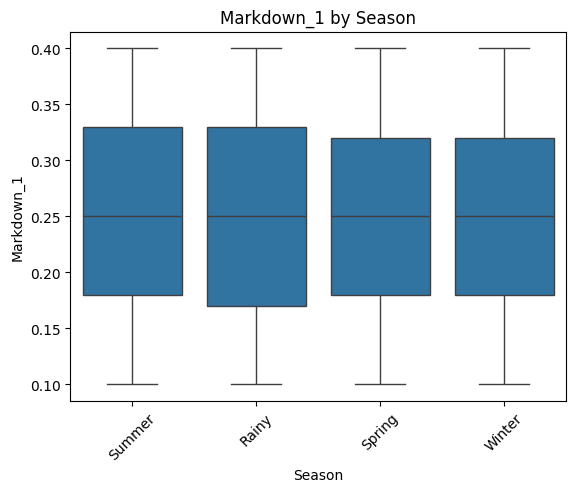

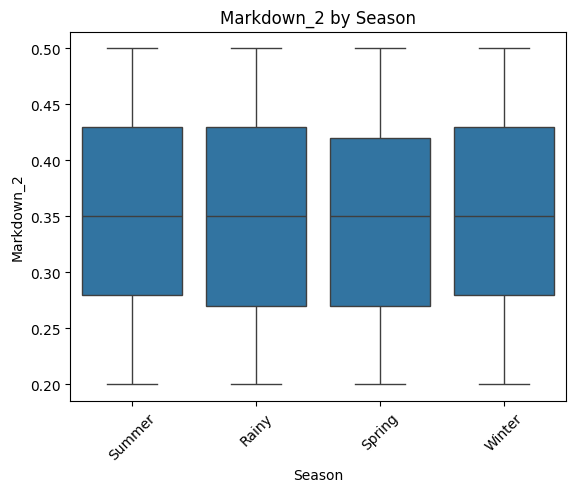

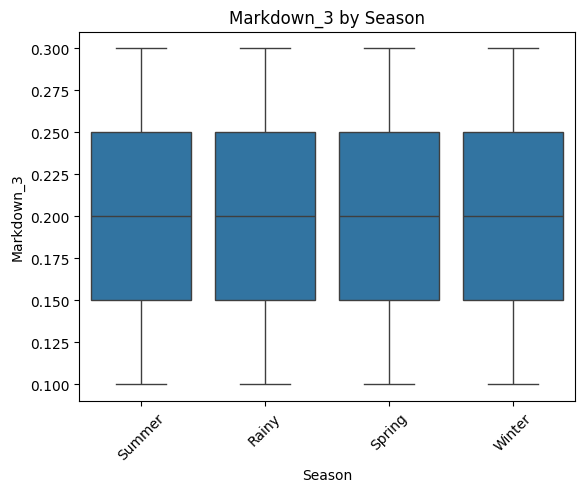

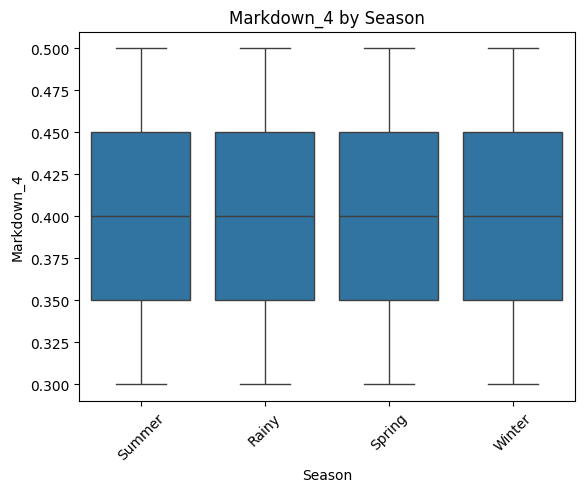

In [33]:
# 9. Markdown dan Season

markdown_cols = ['Markdown_1', 'Markdown_2', 'Markdown_3', 'Markdown_4']

for col in markdown_cols:
    sns.boxplot(data=df, x='Season', y=col)
    plt.title(f'{col} by Season')
    plt.xticks(rotation=45)
    plt.show()


## **Train-Test Split**

In [34]:
# List kolom yang akan di-melted
markdown_columns = ['Markdown_1', 'Markdown_2', 'Markdown_3', 'Markdown_4']
sales_columns = ['Sales_After_M1', 'Sales_After_M2', 'Sales_After_M3', 'Sales_After_M4']
discounted_price_columns = ['Discounted_Price_M1', 'Discounted_Price_M2', 'Discounted_Price_M3', 'Discounted_Price_M4']

# Melting dataframe untuk kolom Sales
df_sales_melted = pd.melt(
    df,
    id_vars=[col for col in df.columns if col not in sales_columns],
    value_vars=sales_columns,
    var_name='Sales_Month',
    value_name='Sales_After'
)

# Melting dataframe untuk kolom Markdown
df_markdown_melted = pd.melt(
    df,
    id_vars=[col for col in df.columns if col not in markdown_columns],
    value_vars=markdown_columns,
    var_name='Markdown_Month',
    value_name='Markdown'
)

# Melting dataframe untuk kolom Discounted Price
df_price_melted = pd.melt(
    df,
    id_vars=[col for col in df.columns if col not in discounted_price_columns],
    value_vars=discounted_price_columns,
    var_name='Price_Month',
    value_name='Final_Price'
)

# Gabungkan hasil melting (pastikan urutannya sama)
df_melted = df_sales_melted.copy()
df_melted['Markdown'] = df_markdown_melted['Markdown'].values
df_melted['Final_Price'] = df_price_melted['Final_Price'].values

# Tambahkan level markdown (M1, M2, ...)
df_melted['Markdown_Level'] = df_melted['Sales_Month'].str.extract(r'M(\d)').astype(int)

# Optional: drop kolom bantu
df_melted.drop(columns=['Sales_Month'], inplace=True)

In [35]:
df_melted.head()

,Product_ID,Category,Brand,Season,Product_Name,Original_Price,Competitor_Price,Seasonality_Factor,Markdown_1,Markdown_2,Markdown_3,Markdown_4,Historical_Sales,Stock_Level,Promotion_Type,Customer Ratings,Return Rate,Optimal Discount,Discounted_Price_M1,Discounted_Price_M2,Discounted_Price_M3,Discounted_Price_M4,Price_per_Stock,Price_Gap_Competitor,Price_Gap_Percent,Sales_After,Markdown,Final_Price,Markdown_Level
0,1,Skincare,BrandA,Summer,Sunscreen,70.39,70.98,1.71,0.31,0.49,0.18,0.48,344,183,In-Store,4.9,1.97,0.36,48.5691,35.8989,57.7198,36.6028,0.382554,-0.59,-0.008312,404,0.31,48.5691,1
1,2,Skincare,BrandB,Rainy,Eye Cream,55.35,56.58,0.85,0.39,0.21,0.10,0.46,98,142,Online,4.0,2.57,0.29,33.7635,43.7265,49.8150,29.8890,0.387063,-1.23,-0.021739,107,0.39,33.7635,1
2,3,Skincare,BrandA,Spring,Face Mist,26.16,28.54,1.03,0.17,0.43,0.30,0.43,72,112,Social Media,2.3,4.64,0.33,21.7128,14.9112,18.3120,14.9112,0.231504,-2.38,-0.083392,72,0.17,21.7128,1
3,4,Bodycare,BrandD,Winter,Shower Gel,99.34,98.57,1.91,0.20,0.21,0.13,0.47,243,57,In-Store,4.9,1.42,0.25,79.4720,78.4786,86.4258,52.6502,1.712759,0.77,0.007812,281,0.20,79.4720,1
4,5,Skincare,BrandA,Winter,Peeling Gel,60.33,61.05,1.65,0.14,0.20,0.21,0.36,251,125,In-Store,4.6,1.36,0.23,51.8838,48.2640,47.6607,38.6112,0.478810,-0.72,-0.011794,289,0.14,51.8838,1


In [36]:
# Memisahkan fitur (X) dan target label (y)
X = df_melted.drop(['Sales_After'], axis = 1)
y = df_melted['Sales_After']

In [37]:
# Splitting dataset (75:25)
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.25,
    random_state=96
)

print(f"Training set: {X_train.shape}, Testing set: {X_test.shape}")

Training set: (130200, 28), Testing set: (43400, 28)


## **Train**

In [38]:
# Menggabungkan X_train dan y_train (untuk memudahkan EDA)
df_train = pd.concat([X_train, y_train], axis=1)

In [39]:
df_train.columns

Index(['Product_ID', 'Category', 'Brand', 'Season', 'Product_Name',
       'Original_Price', 'Competitor_Price', 'Seasonality_Factor',
       'Markdown_1', 'Markdown_2', 'Markdown_3', 'Markdown_4',
       'Historical_Sales', 'Stock_Level', 'Promotion_Type', 'Customer Ratings',
       'Return Rate', 'Optimal Discount', 'Discounted_Price_M1',
       'Discounted_Price_M2', 'Discounted_Price_M3', 'Discounted_Price_M4',
       'Price_per_Stock', 'Price_Gap_Competitor', 'Price_Gap_Percent',
       'Markdown', 'Final_Price', 'Markdown_Level', 'Sales_After'],
      dtype='object')

In [40]:
num_features = df_train.select_dtypes(exclude=['object']).columns

### **Outlier Check**

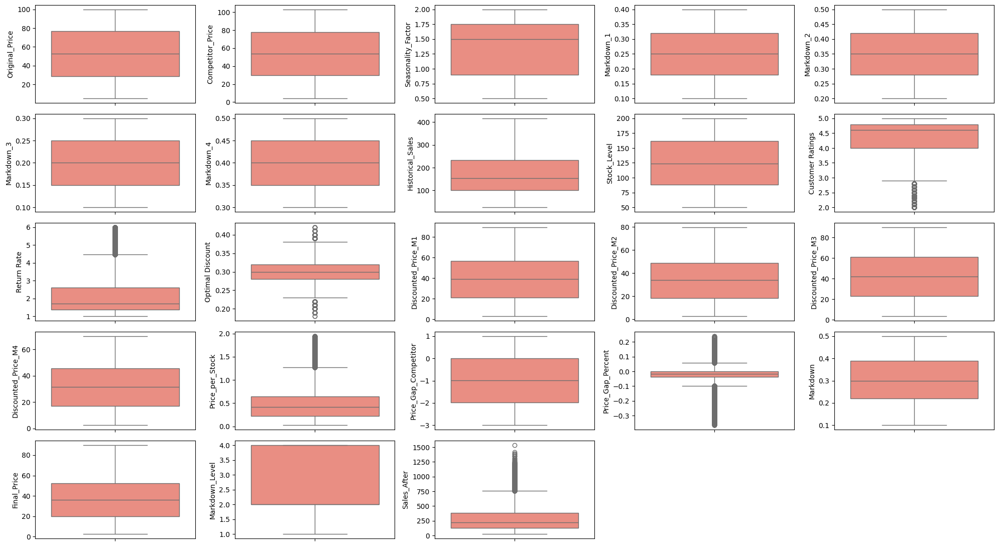

In [41]:
plt.figure(figsize=(20,50))

for i in range(0, len(num_features)):
    plt.subplot(len(num_features), 5, i+1)
    sns.boxplot(y=df_train[num_features[i]], color='salmon', orient='v')
    plt.tight_layout()

Walaupun terdeteksi ada outlier, tetapi nilai outlier tersebut masih wajar. Sehingga outlier akan dibiarkan the way it is.

### **EDA**

In [42]:
df_train.describe()

,Original_Price,Competitor_Price,Seasonality_Factor,Markdown_1,Markdown_2,Markdown_3,Markdown_4,Historical_Sales,Stock_Level,Customer Ratings,Return Rate,Optimal Discount,Discounted_Price_M1,Discounted_Price_M2,Discounted_Price_M3,Discounted_Price_M4,Price_per_Stock,Price_Gap_Competitor,Price_Gap_Percent,Markdown,Final_Price,Markdown_Level,Sales_After
count,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000,130200.000000
mean,52.719310,53.708774,1.329227,0.250474,0.350051,0.199773,0.400090,171.869608,124.928487,4.290879,2.203661,0.300305,39.493075,34.270361,42.189915,31.616943,0.482523,-0.989463,-0.027380,0.300480,36.870039,2.500376,277.283187
std,27.517388,27.542608,0.466193,0.086437,0.086554,0.057844,0.057917,88.497395,43.203920,0.810824,1.259231,0.036812,21.212464,18.627877,22.287802,16.845682,0.336165,1.149166,0.049982,0.108028,20.275698,1.118395,194.877771
min,5.000000,4.100000,0.500000,0.100000,0.200000,0.100000,0.300000,26.000000,50.000000,2.000000,1.000000,0.180000,3.036000,2.510000,3.528000,2.535000,0.025482,-3.000000,-0.365360,0.100000,2.510000,1.000000,25.000000
25%,28.840000,29.830000,0.900000,0.180000,0.280000,0.150000,0.350000,101.000000,88.000000,4.000000,1.360000,0.280000,21.391500,18.395700,23.031500,17.214000,0.228015,-1.980000,-0.038976,0.220000,19.724775,2.000000,129.000000
50%,52.960000,53.960000,1.500000,0.250000,0.350000,0.200000,0.400000,154.000000,124.000000,4.600000,1.720000,0.300000,39.165000,33.858500,42.186000,31.519500,0.419321,-0.980000,-0.018454,0.300000,36.126350,2.000000,220.000000
75%,76.680000,77.630000,1.750000,0.320000,0.420000,0.250000,0.450000,232.000000,162.000000,4.800000,2.600000,0.320000,56.562400,48.832600,61.037900,45.430350,0.646071,0.000000,0.000000,0.390000,52.325100,4.000000,382.000000
max,100.000000,102.960000,2.000000,0.400000,0.500000,0.300000,0.500000,416.000000,200.000000,5.000000,6.000000,0.420000,89.559000,79.816000,89.847000,69.937000,1.943137,1.000000,0.239024,0.500000,89.820000,4.000000,1535.000000


In [43]:
df_train.describe(include='object')

,Product_ID,Category,Brand,Season,Product_Name,Promotion_Type
count,130200,130200,130200,130200,130200,130200
unique,43200,3,6,4,59,3
top,38631,Skincare,BrandC,Spring,Anti-Aging Cream,In-Store
freq,4,58615,22047,33158,3233,43900


#### Univariate Analysis

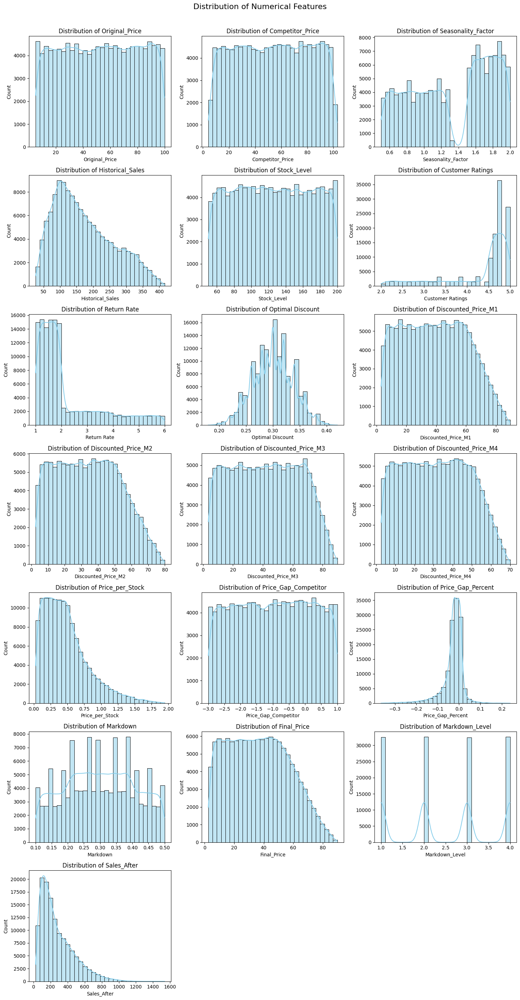

In [44]:
# List kolom yang ingin dikecualikan
exclude_cols = ['Markdown_1', 'Markdown_2', 'Markdown_3', 'Markdown_4']

#  Mengambil kolom numerik
numerical_cols = [col for col in df_train.select_dtypes(include=np.number).columns if col not in exclude_cols]


# Membuat plot distribusi untuk kolom numerik
# Setup figure
n_cols = 3
n_rows = int(np.ceil(len(numerical_cols) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*4))
axes = axes.flatten()

# Plot
for i, col in enumerate(numerical_cols):
    sns.histplot(df_train[col], kde=True, bins=30, color='skyblue', ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Count')

# Hapus subplot kosong (jika ada)
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle('Distribution of Numerical Features', fontsize=16, y=1.02)
plt.show()



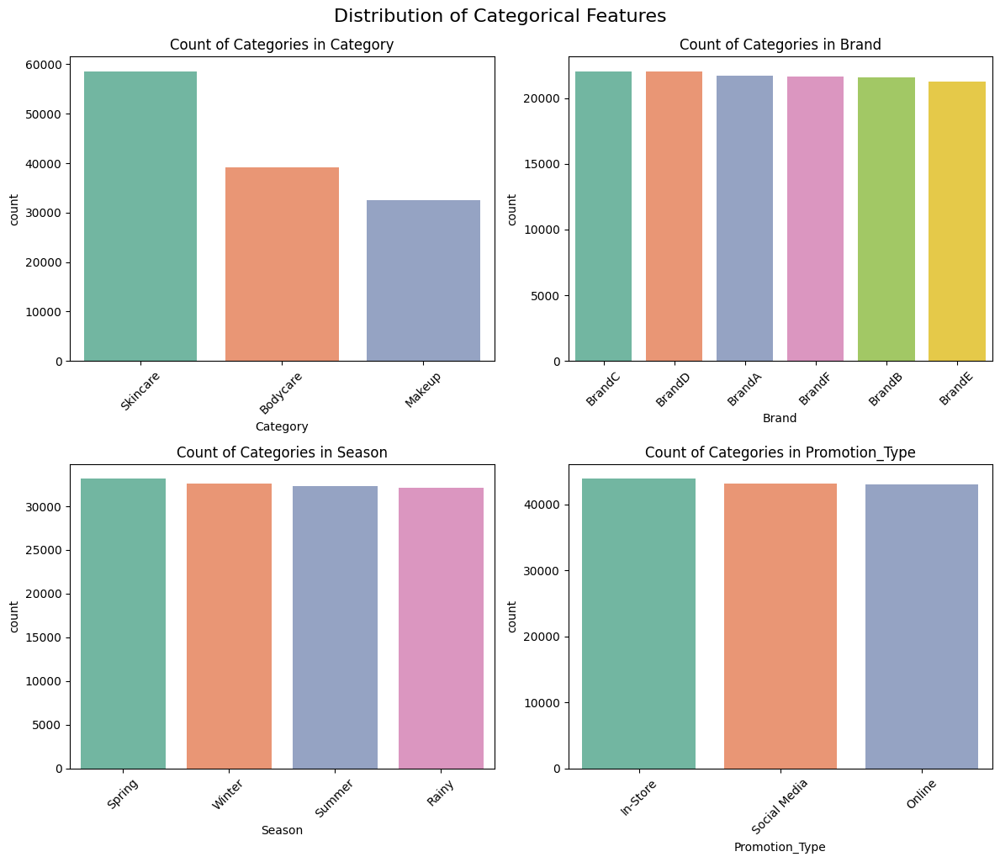

In [45]:
# List kolom yang ingin dikecualikan
exclude_cols_cat = ['Product_ID', 'Product_Name', 'comb']

# Memilih kolom kategorikal
categorical_cols = [col for col in df_train.select_dtypes(include='object').columns if col not in exclude_cols_cat]

# Membuat plot distribusi untuk kolom kategorikal
# Setup figure
n_cols = 2
n_rows = int(np.ceil(len(categorical_cols) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*6, n_rows*5))
axes = axes.flatten()

# Plot
for i, col in enumerate(categorical_cols):
    sns.countplot(data=df_train, x=col, ax=axes[i], palette='Set2', order=df_train[col].value_counts().index)
    axes[i].set_title(f'Count of Categories in {col}')
    axes[i].tick_params(axis='x', rotation=45)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle('Distribution of Categorical Features', fontsize=16, y=1.02)
plt.show()


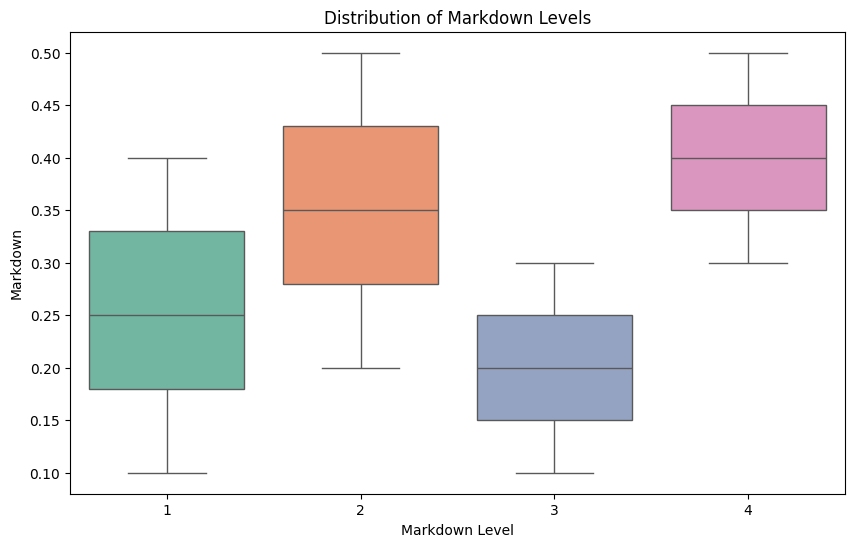

In [46]:
markdown_cols = [f"Markdown_{i}" for i in range(1, 5)]
df_melt = df_melted[markdown_cols].melt(var_name='Markdown_Level', value_name='Discount')

plt.figure(figsize=(10,6))
sns.boxplot(data=df_melted, x='Markdown_Level', y='Markdown', palette='Set2')
plt.title("Distribution of Markdown Levels")
plt.ylabel("Markdown")
plt.xlabel("Markdown Level")
plt.grid(False)
plt.show()

#### Multivariate

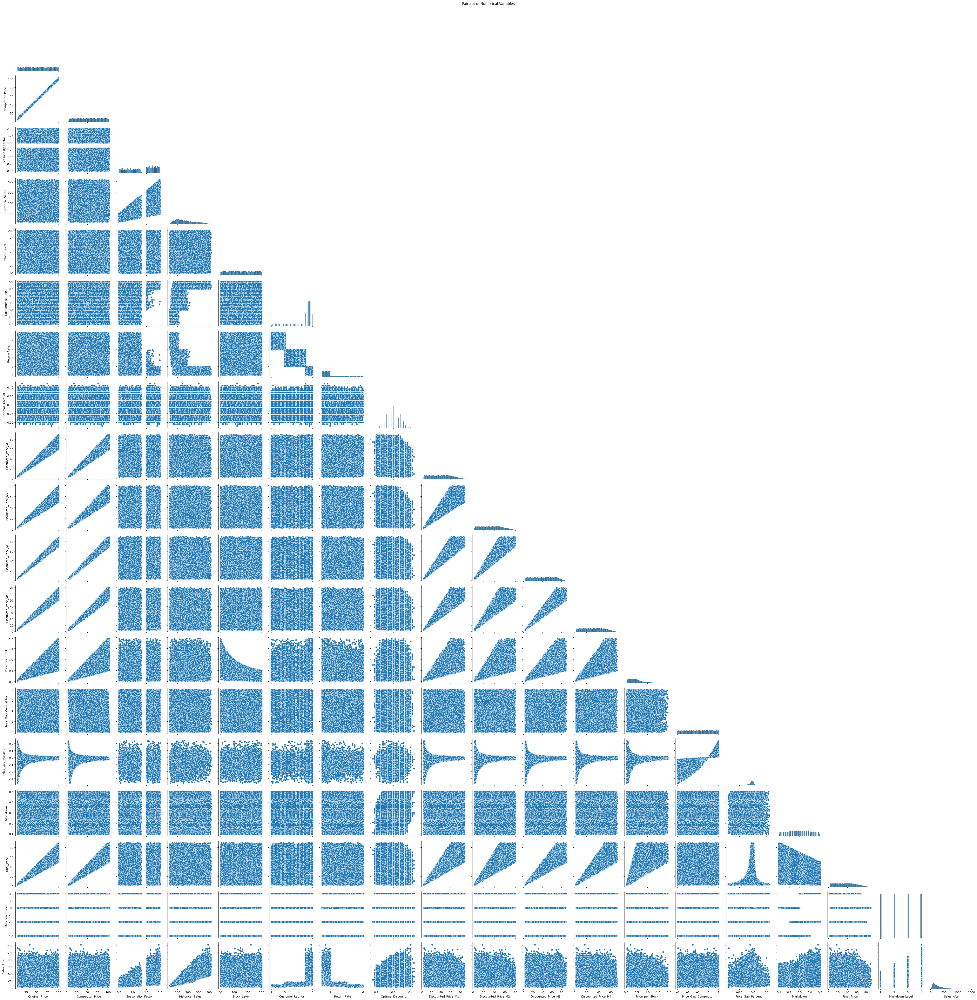

In [47]:
# Pairplot
sns.pairplot(df_train[numerical_cols], corner=True)
plt.tight_layout()
plt.suptitle("Pairplot of Numerical Variables", y=1.02)
plt.show()


#### Deep Dive

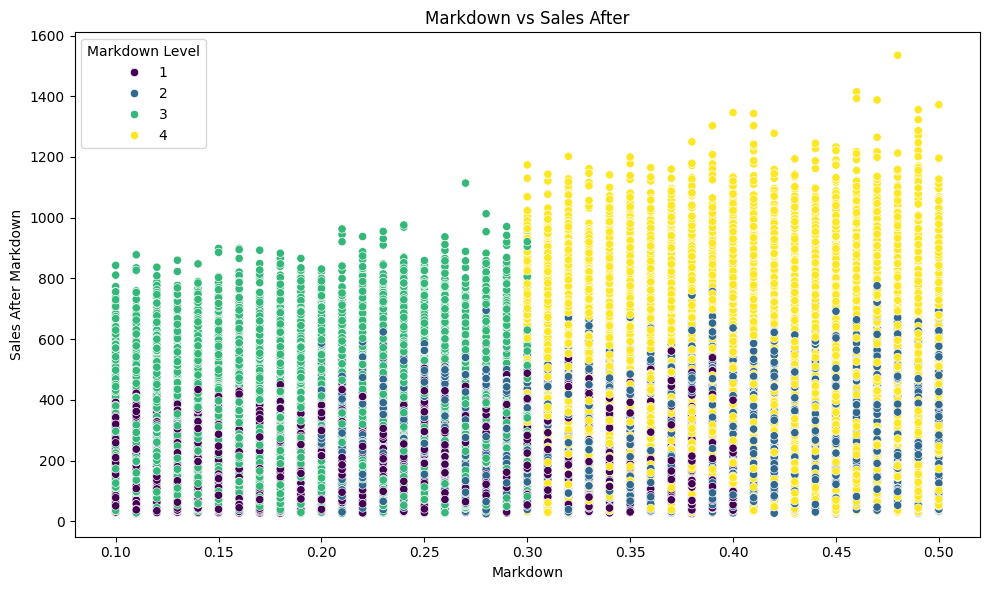

In [48]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_train, x='Markdown', y='Sales_After', hue='Markdown_Level', palette='viridis')
plt.title('Markdown vs Sales After')
plt.xlabel('Markdown')
plt.ylabel('Sales After Markdown')
plt.legend(title='Markdown Level')
plt.tight_layout()
plt.show()

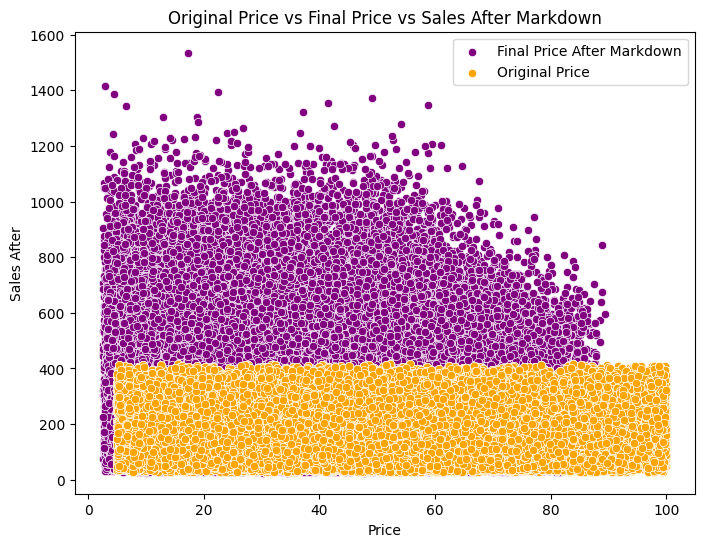

In [49]:
# Membandingkan harga original dan final terhadap penjualan
plt.figure(figsize=(8, 6))
#sns.scatterplot(x=df_melted['Original_Price'], y=df_melted['Historical_Sales'], color='orange', label='Original Price')
sns.scatterplot(x=df_train['Final_Price'], y=df_train['Sales_After'], color='purple', label='Final Price After Markdown')
sns.scatterplot(x=df_train['Original_Price'], y=df_train['Historical_Sales'], color='orange', label='Original Price')
plt.title('Original Price vs Final Price vs Sales After Markdown')
plt.xlabel('Price')
plt.ylabel('Sales After')
plt.legend()
plt.show()

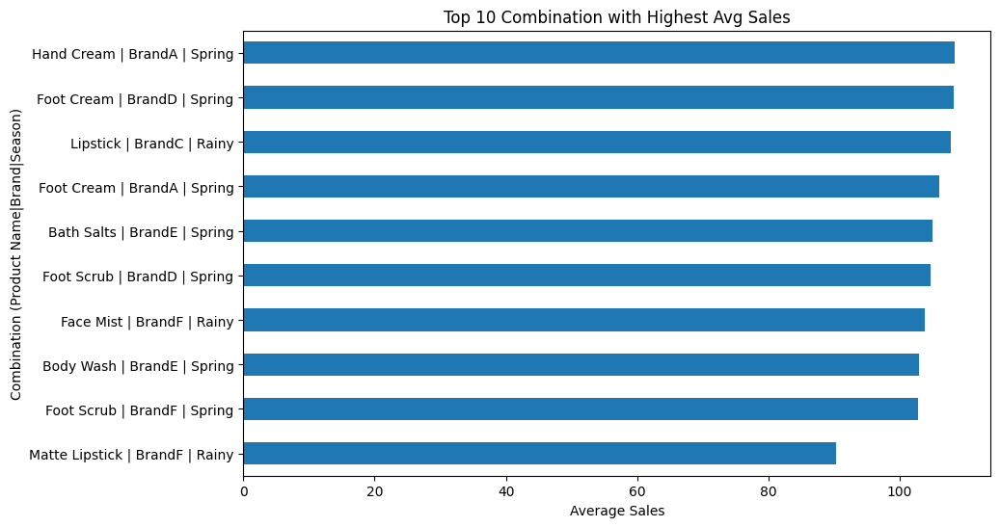

In [50]:
# Top kombinasi produk | brand | season dengan average sales tertinggi
df_train['comb'] = df_train['Product_Name'] + " | " + df_train['Brand'] + " | " + df_train['Season']
top_combs = df_train.groupby('comb')['Sales_After'].mean().sort_values(ascending=True).head(10)
top_combs.plot(kind='barh', figsize=(10, 6), title="Top 10 Combination with Highest Avg Sales")
plt.xlabel("Average Sales")
plt.ylabel('Combination (Product Name|Brand|Season)')
plt.show()

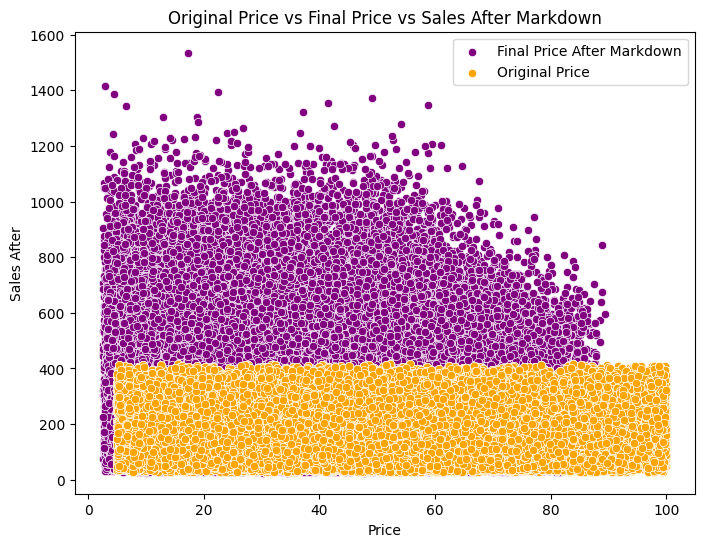

In [51]:
# Membandingkan harga original dan final terhadap penjualan
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df_train['Final_Price'], y=df_train['Sales_After'], color='purple', label='Final Price After Markdown')
sns.scatterplot(x=df_train['Original_Price'], y=df_train['Historical_Sales'], color='orange', label='Original Price')
plt.title('Original Price vs Final Price vs Sales After Markdown')
plt.xlabel('Price')
plt.ylabel('Sales After')
plt.legend()
plt.show()

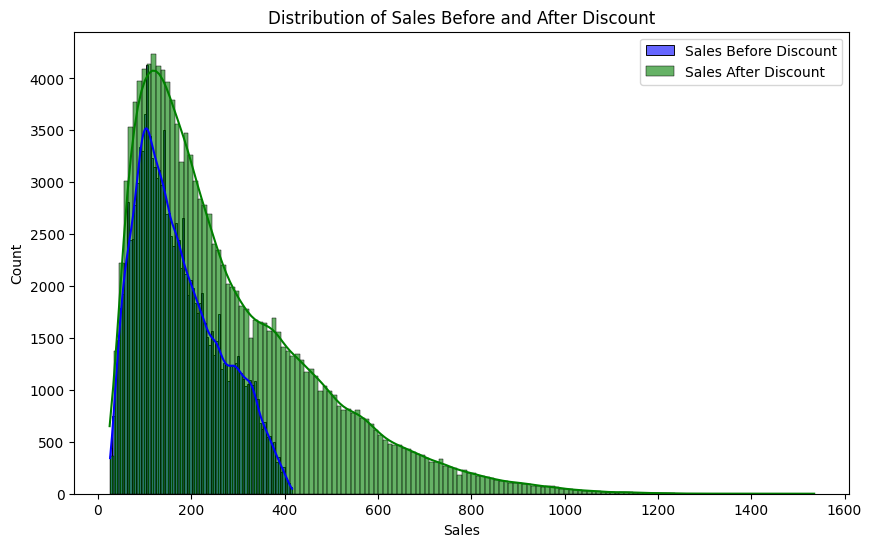

In [52]:
# Plot distribusi sebelum dan sesudah diskon
plt.figure(figsize=(10, 6))
sns.histplot(df_train['Historical_Sales'], kde=True, label="Sales Before Discount", color='blue', alpha=0.6)
sns.histplot(df_train['Sales_After'], kde=True, label="Sales After Discount", color='green', alpha=0.6)
plt.title('Distribution of Sales Before and After Discount')
plt.xlabel('Sales')
plt.title('Distribution of Sales Before and After Discount')
plt.legend()
plt.show()


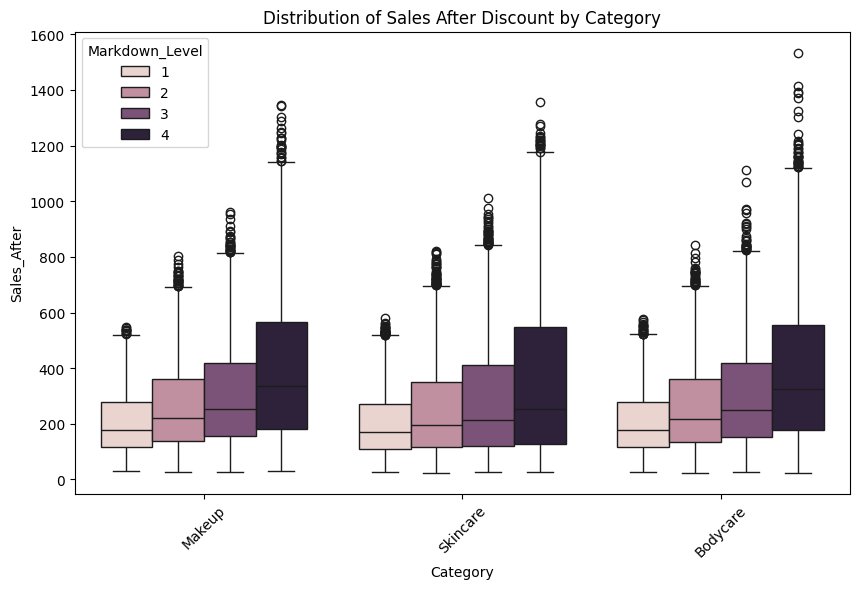

In [53]:
# Respon sales berdasarkan Kategori Produk
plt.figure(figsize=(10, 6))
sns.boxplot(x='Category', y='Sales_After', hue='Markdown_Level', data=df_train)
plt.title("Distribution of Sales After Discount by Category")
plt.xticks(rotation=45)
plt.grid(False)


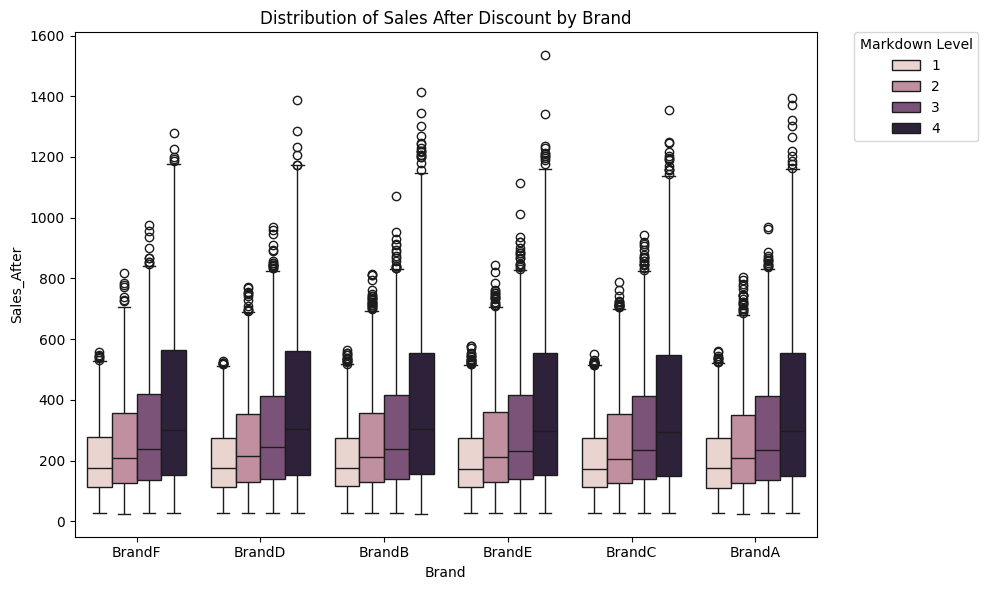

In [54]:
# Respon sales terhadap Brand
plt.figure(figsize=(10, 6))
sns.boxplot(x='Brand', y='Sales_After', hue='Markdown_Level', data=df_train)
plt.title("Distribution of Sales After Discount by Brand")
plt.grid(False)

plt.legend(title='Markdown Level', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

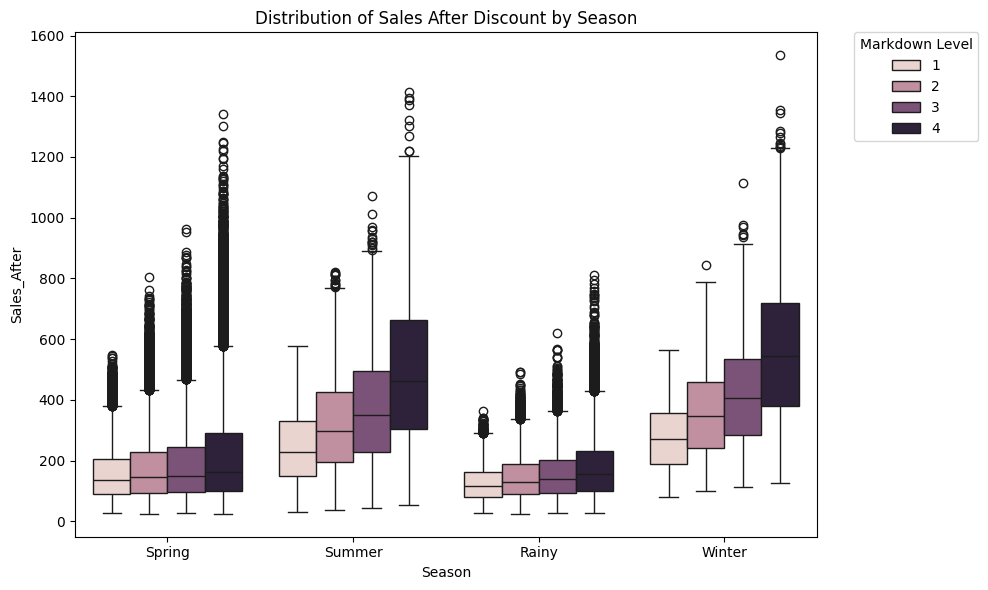

In [55]:
# Respon sales terhadap musim
plt.figure(figsize=(10, 6))
sns.boxplot(x='Season', y='Sales_After', hue='Markdown_Level', data=df_train)
plt.title("Distribution of Sales After Discount by Season")
plt.grid(False)

plt.legend(title='Markdown Level', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

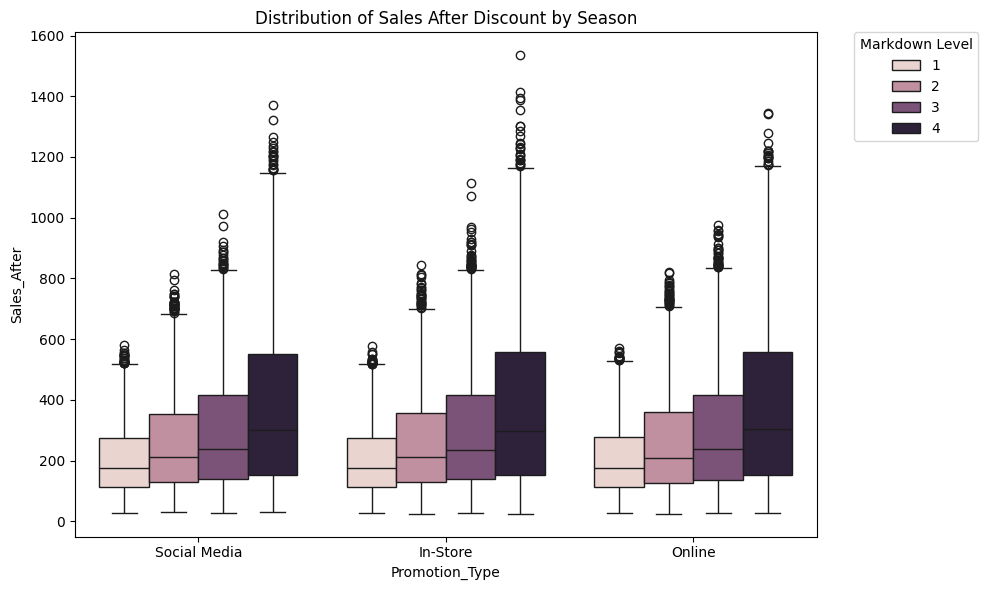

In [56]:
# Respon sales terhadap tipe promosi
plt.figure(figsize=(10, 6))
sns.boxplot(x='Promotion_Type', y='Sales_After', hue='Markdown_Level', data=df_train)
plt.title("Distribution of Sales After Discount by Season")
plt.grid(False)

plt.legend(title='Markdown Level', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()
plt.show()

In [57]:
df_train['Final_Price'] = df_train['Original_Price'] * (1 - df_train['Markdown'])
df_train['Revenue'] = df_train['Final_Price'] * df_train['Sales_After']

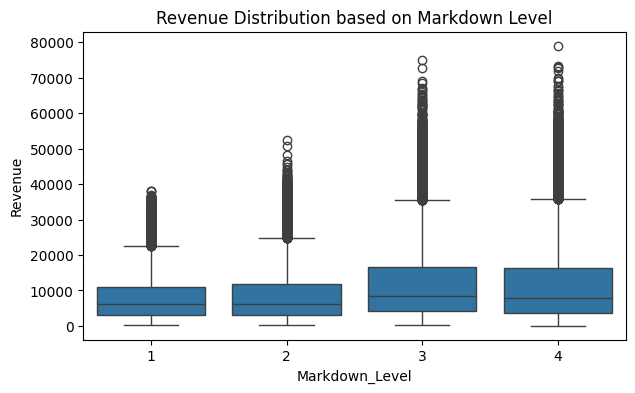

In [58]:
# Distribusi Revenue per Markdown_Level
plt.figure(figsize=(7,4))
sns.boxplot(x='Markdown_Level', y='Revenue', data=df_train)
plt.title("Revenue Distribution based on Markdown Level")
plt.grid(False)
plt.show()


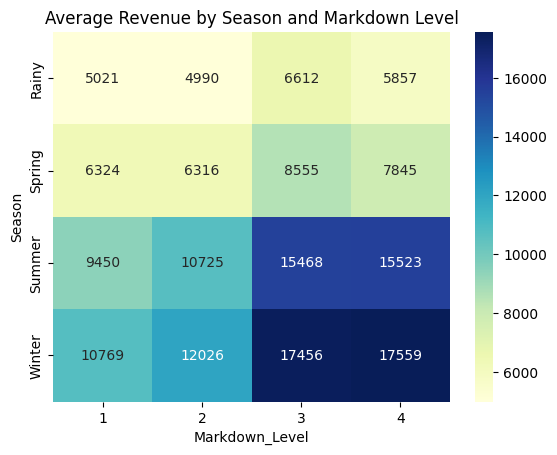

In [59]:
# Musim tertentu butuh strategi diskon yang berbeda? Musim hujan mungkin lebih sensitif?
pivot = df_train.pivot_table(index='Season', columns='Markdown_Level', values='Revenue', aggfunc='mean')
plt.xlabel('Markdown Level')
sns.heatmap(pivot, annot=True, fmt=".0f", cmap='YlGnBu')
plt.title("Average Revenue by Season and Markdown Level")
plt.show()

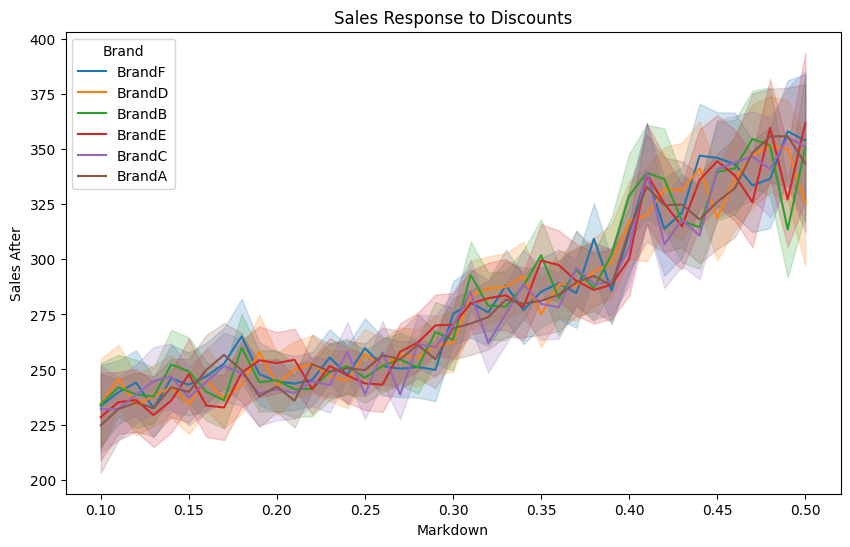

In [60]:
# Respons Brand terhadap Diskon
top_brands = df_train['Brand'].value_counts().head(6).index
df_top_brands = df_train[df_train['Brand'].isin(top_brands)]

plt.figure(figsize=(10,6))
sns.lineplot(data=df_top_brands, x='Markdown', y='Sales_After', hue='Brand')
plt.title("Sales Response to Discounts")
plt.xlabel("Markdown")
plt.ylabel("Sales After")
plt.show()


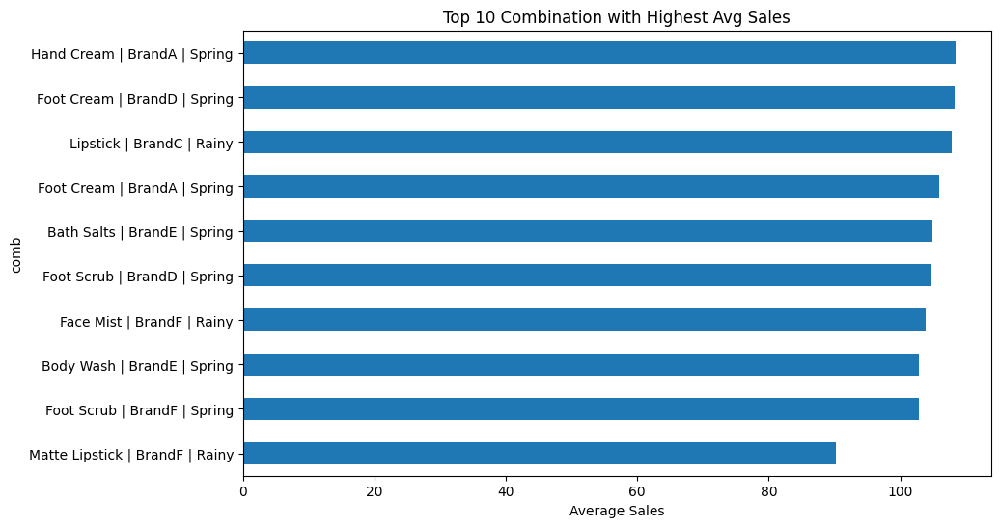

In [61]:
# Top kombinasi produk | brand | season dengan average sales tertinggi
df_train['comb'] = df_train['Product_Name'] + " | " + df_train['Brand'] + " | " + df_train['Season']
top_combs = df_train.groupby('comb')['Sales_After'].mean().sort_values(ascending=True).head(10)
top_combs.plot(kind='barh', figsize=(10, 6), title="Top 10 Combination with Highest Avg Sales")
plt.xlabel("Average Sales")
plt.show()

### **Multicolinearity**

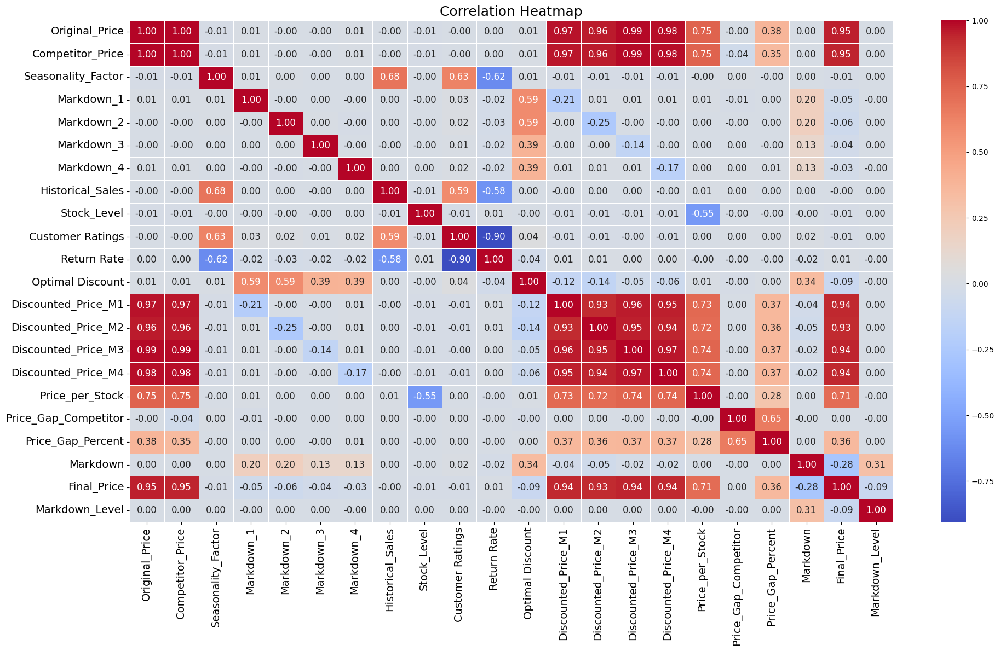

In [62]:
# Mengambil subset data yang hanya berisi fitur numerik dari fitur (X_train)
X_train_num = X_train.select_dtypes(exclude=['object'])

# Menghitung korelasi
corr_matrix = X_train_num.corr()

# Visualisasi heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    linewidths=0.5,
    annot_kws={"size": 12}  # ukuran font angka korelasi
)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.title("Correlation Heatmap", fontsize=18)
plt.tight_layout()
plt.show()

Dari heatmap tersebut, dapat diketahui fitur yang memiliki korelasi tinggi (> 0.8) dengan fitur lainnya, yakni:
- Original_Price -- Competitor_Price
- Original_Price -- Discounted_Price_M1
- Original_Price -- Discounted_Price_M2
- Original_Price -- Discounted_Price_M3
- Original_Price -- Discounted_Price_M4
- Discounted_Price_M1 -- Discounted_Price_M2
- Discounted_Price_M1 -- Discounted_Price_M3
- Discounted_Price_M1 -- Discounted_Price_M4
- Discounted_Price_M2 -- Discounted_Price_M3
- Discounted_Price_M2 -- Discounted_Price_M4
- Discounted_Price_M3 -- Discounted_Price_M5

Fitur-fitur tersebut akan di-drop pada langkah selanjutnya

### **Drop Columns**

Berikut list fitur-fitur yang akan di-drop karena tidak dibutuhkan untuk modeling atau memiliki colinearity yang tinggi
- Product ID
- Markdown_1
- Markdown_2
- Markdown_3
- Markdown_4
- Sales Month
- Competitor Price
- Discounted_Price_M1
- Discounted_Price_M2
- Discounted_Price_M3
- Discounted_Price_M4


In [63]:
X_train_copy = X_train.copy()
X_test_copy = X_test.copy()

In [64]:
# List kolom yang akan di-drop
cols_to_drop = [
    'Product_ID',
    'Competitor_Price',
    'Final_Price',
    'Markdown_1',
    'Markdown_2',
    'Markdown_3',
    'Markdown_4',
    'Discounted_Price_M1',
    'Discounted_Price_M2',
    'Discounted_Price_M3',
    'Discounted_Price_M4',
    'Sales_Month'
]

# Drop kolom-kolom tersebut dari X_train
X_train = X_train.drop(columns=cols_to_drop, errors='ignore')

In [65]:
X_train.head()

,Category,Brand,Season,Product_Name,Original_Price,Seasonality_Factor,Historical_Sales,Stock_Level,Promotion_Type,Customer Ratings,Return Rate,Optimal Discount,Price_per_Stock,Price_Gap_Competitor,Price_Gap_Percent,Markdown,Markdown_Level
126778,Makeup,BrandF,Spring,Matte Lipstick,23.17,1.63,145,168,Social Media,4.8,1.28,0.32,0.137101,-2.29,-0.089945,0.28,3
153639,Makeup,BrandF,Summer,Matte Lipstick,13.33,0.91,67,121,In-Store,4.5,2.19,0.24,0.109262,-1.15,-0.079420,0.32,4
63803,Makeup,BrandD,Spring,Mascara,90.29,1.86,242,199,Online,4.9,1.44,0.24,0.451450,-1.98,-0.021459,0.24,2
80110,Skincare,BrandF,Rainy,Facial Essence,95.15,0.97,98,151,Online,4.4,2.86,0.27,0.625987,-0.13,-0.001364,0.25,2
80088,Makeup,BrandB,Spring,Setting Powder,6.89,1.94,250,124,In-Store,4.9,1.70,0.32,0.055120,-2.77,-0.286749,0.42,2


### **Encoding**

In [66]:
# Men-check jumlah unique value dari setiap kategori

categorical_cols = X_train.select_dtypes(include='object').columns

for col in categorical_cols:
    print(f"\nKolom: {col}")
    display(X_train[col].value_counts())
    print()



Kolom: Category


Category
Skincare    58615
Bodycare    39081
Makeup      32504
Name: count, dtype: int64



Kolom: Brand


Brand
BrandC    22047
BrandD    22001
BrandA    21730
BrandF    21632
BrandB    21565
BrandE    21225
Name: count, dtype: int64



Kolom: Season


Season
Spring    33158
Winter    32586
Summer    32333
Rainy     32123
Name: count, dtype: int64



Kolom: Product_Name


Product_Name
Anti-Aging Cream        3233
Vitamin C Serum         3220
Pore Minimizer          3202
Face Toner              3187
Face Serum              3181
Acne Treatment Gel      3141
Hydrating Serum         3131
Eye Cream               3111
Facial Essence          3093
Face Mist               3085
Brightening Cream       3056
Sunscreen               3050
Hydrating Mask          3046
Makeup Remover          3021
Night Cream             3004
Exfoliating Scrub       2986
Peeling Gel             2975
Face Oil                2974
Facial Cleanser         2919
Shaving Gel             2081
Deodorant               2078
After-Sun Lotion        2066
Body Wash               2047
Body Scrub              2020
Foot Cream              2008
Body Cream              2004
Body Balm               1989
Body Lotion             1987
Anti-Cellulite Cream    1978
Stretch Mark Cream      1952
Foot Scrub              1923
Hand Cream              1905
Exfoliating Gloves      1903
Shower Gel              1893
B



Kolom: Promotion_Type


Promotion_Type
In-Store        43900
Social Media    43213
Online          43087
Name: count, dtype: int64

- Kolom 'Category', 'Season', dan 'Promotion_Type' akan di-encode menggunakan One Hot Encoding (OHE)
- Kolom 'Brand' dan 'Product Name' akan di-encode menggunakan Target Encoding

In [67]:
# One Hot Encoding
X_train_encoded = pd.get_dummies(X_train, columns=['Category', 'Season', 'Promotion_Type'], drop_first=False)

In [68]:
# Target Encoding

# Menggabungkan X_train dan y_train untuk proses target encoding
train_encoding = X_train.copy()
train_encoding['Sales_After'] = y_train

# Menghitung rata-rata target untuk setiap Brand dan Product_Name
brand_mean = train_encoding.groupby('Brand')['Sales_After'].mean()
product_mean = train_encoding.groupby('Product_Name')['Sales_After'].mean()

# Mapping ke X_train dan X_test
X_train_encoded['Brand_encoded'] = X_train['Brand'].map(brand_mean)
X_train_encoded['Product_Name_encoded'] = X_train['Product_Name'].map(product_mean)


In [69]:
X_train_encoded.head()

,Brand,Product_Name,Original_Price,Seasonality_Factor,Historical_Sales,Stock_Level,Customer Ratings,Return Rate,Optimal Discount,Price_per_Stock,Price_Gap_Competitor,Price_Gap_Percent,Markdown,Markdown_Level,Category_Bodycare,Category_Makeup,Category_Skincare,Season_Rainy,Season_Spring,Season_Summer,Season_Winter,Promotion_Type_In-Store,Promotion_Type_Online,Promotion_Type_Social Media,Brand_encoded,Product_Name_encoded
126778,BrandF,Matte Lipstick,23.17,1.63,145,168,4.8,1.28,0.32,0.137101,-2.29,-0.089945,0.28,3,False,True,False,False,True,False,False,False,False,True,278.605446,295.256223
153639,BrandF,Matte Lipstick,13.33,0.91,67,121,4.5,2.19,0.24,0.109262,-1.15,-0.079420,0.32,4,False,True,False,False,False,True,False,True,False,False,278.605446,295.256223
63803,BrandD,Mascara,90.29,1.86,242,199,4.9,1.44,0.24,0.451450,-1.98,-0.021459,0.24,2,False,True,False,False,True,False,False,False,True,False,278.200264,293.076067
80110,BrandF,Facial Essence,95.15,0.97,98,151,4.4,2.86,0.27,0.625987,-0.13,-0.001364,0.25,2,False,False,True,True,False,False,False,False,True,False,278.605446,272.003233
80088,BrandB,Setting Powder,6.89,1.94,250,124,4.9,1.70,0.32,0.055120,-2.77,-0.286749,0.42,2,False,True,False,False,True,False,False,True,False,False,278.152748,280.129749


In [70]:
# Drop kolom original
X_train_encoded = X_train_encoded.drop(columns=['Brand', 'Product_Name'], errors='ignore')

### **Scaling**

In [71]:
# Mengambil kolom numerik dari data train
numeric_cols = X_train_encoded.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Mengecualikan kolom hasil OHE (berisi 1/0)
exclude_prefix = ['Category_', 'Season_', 'Promotion_Type_']

numeric_cols = [col for col in X_train_encoded.select_dtypes(include=['int64', 'float64']).columns
                if not any(col.startswith(prefix) for prefix in exclude_prefix)]

In [72]:
# Menginisialisasi StandardScaler
scaler = StandardScaler()

# Melakukan transformasi (scaling) hanya pada kolom numerik
X_train_encoded[numeric_cols] = scaler.fit_transform(X_train_encoded[numeric_cols])

In [73]:
#  Menyimpan semua nama kolom hasil encoding dan scaling (untuk menggunakan hasil model)
feature_columns = X_train_encoded.columns.tolist()

# Menyimpan daftar fitur yang diharapkan model ketika memprediksi ke data baru (untuk menggunakan hasil model)
expected_features = X_train_encoded.columns.tolist()

In [74]:
features_model = X_train_encoded.columns.tolist()

In [110]:
X_train_encoded.columns

Index(['Original_Price', 'Seasonality_Factor', 'Historical_Sales',
       'Stock_Level', 'Customer Ratings', 'Return Rate', 'Optimal Discount',
       'Price_per_Stock', 'Price_Gap_Competitor', 'Price_Gap_Percent',
       'Markdown', 'Markdown_Level', 'Category_Bodycare', 'Category_Makeup',
       'Category_Skincare', 'Season_Rainy', 'Season_Spring', 'Season_Summer',
       'Season_Winter', 'Promotion_Type_In-Store', 'Promotion_Type_Online',
       'Promotion_Type_Social Media', 'Brand_encoded', 'Product_Name_encoded'],
      dtype='object')

In [75]:
X_train_encoded.head()

,Original_Price,Seasonality_Factor,Historical_Sales,Stock_Level,Customer Ratings,Return Rate,Optimal Discount,Price_per_Stock,Price_Gap_Competitor,Price_Gap_Percent,Markdown,Markdown_Level,Category_Bodycare,Category_Makeup,Category_Skincare,Season_Rainy,Season_Spring,Season_Summer,Season_Winter,Promotion_Type_In-Store,Promotion_Type_Online,Promotion_Type_Social Media,Brand_encoded,Product_Name_encoded
126778,-1.073846,0.645170,-0.303621,0.996939,0.627907,-0.733515,0.535012,-1.027543,-1.131727,-1.251762,-0.189577,0.446734,False,True,False,False,True,False,False,False,False,True,1.081729,1.495286
153639,-1.431439,-0.899261,-1.185007,-0.090929,0.257912,-0.010848,-1.638185,-1.110354,-0.139699,-1.041181,0.180698,1.340876,False,True,False,False,False,True,False,True,False,False,1.081729,1.495286
63803,1.365349,1.138530,0.792460,1.714469,0.751239,-0.606452,-1.638185,-0.092434,-0.861965,0.118473,-0.559852,-0.447407,False,True,False,False,True,False,False,False,True,False,0.750253,1.313905
80110,1.541965,-0.770559,-0.834713,0.603455,0.134580,0.521225,-0.823236,0.426769,0.747905,0.520510,-0.467283,-0.447407,False,False,True,True,False,False,False,False,True,False,1.081729,-0.439271
80088,-1.665474,1.310133,0.882859,-0.021491,0.751239,-0.399976,0.535012,-1.271414,-1.549423,-5.189319,1.106387,-0.447407,False,True,False,False,True,False,False,True,False,False,0.711380,0.236823


## **Test**

In [76]:
# Men-drop kolom yang telah di-drop pada data train
X_test = X_test.drop(columns=cols_to_drop, errors='ignore')

### **Encoding**

In [77]:
# One Hot Encoding pada data test
X_test_encoded = pd.get_dummies(X_test, columns=['Category', 'Season', 'Promotion_Type'], drop_first=False)

In [78]:
# Menyamakan kolom train-test jika ada perbedaan kategori (just in case)
X_test_encoded = X_test_encoded.reindex(columns=X_train_encoded.columns, fill_value=0)

In [79]:
# Melakukan target encoding berdasarkan data train
X_test_encoded['Brand_encoded'] = X_test['Brand'].map(brand_mean)
X_test_encoded['Product_Name_encoded'] = X_test['Product_Name'].map(product_mean)

In [80]:
# Drop kolom original
X_test_encoded = X_test_encoded.drop(columns=['Brand', 'Product_Name'], errors='ignore')

### **Scaling**

In [81]:
# Melakukan scaling based on data train
X_test_encoded[numeric_cols] = scaler.transform(X_test_encoded[numeric_cols])

In [82]:
X_test_encoded.head()

,Original_Price,Seasonality_Factor,Historical_Sales,Stock_Level,Customer Ratings,Return Rate,Optimal Discount,Price_per_Stock,Price_Gap_Competitor,Price_Gap_Percent,Markdown,Markdown_Level,Category_Bodycare,Category_Makeup,Category_Skincare,Season_Rainy,Season_Spring,Season_Summer,Season_Winter,Promotion_Type_In-Store,Promotion_Type_Online,Promotion_Type_Social Media,Brand_encoded,Product_Name_encoded
57254,0.327092,-0.427352,-0.394020,-0.576998,-0.358747,0.449752,-0.551586,0.382452,0.138765,0.282322,-0.467283,-0.447407,False,False,True,True,False,False,False,True,False,False,-1.075818,-0.886712
96977,-0.910675,0.945476,0.035373,-0.692729,0.504576,-0.320562,1.078311,-0.578284,-0.818455,-0.757172,-0.097008,0.446734,False,True,False,False,False,False,True,False,False,True,1.081729,1.281776
149352,0.648708,-0.084145,0.724661,1.297839,0.751239,-0.407918,-1.094886,-0.281933,0.887137,0.556318,0.736111,1.340876,False,False,True,False,True,False,False,False,True,False,0.711380,-1.109121
77386,1.512166,0.409215,0.961957,-1.410259,0.751239,-0.360269,1.349961,2.881658,0.573865,0.478059,1.476662,-0.447407,False,True,False,False,False,False,True,True,False,False,-1.075818,1.495286
119275,-1.169422,0.924026,1.300952,1.066378,0.751239,-0.860577,-1.366535,-1.080142,0.626077,0.288221,-1.392972,0.446734,False,False,True,False,False,False,True,True,False,False,1.081729,-0.606118


## **Model and Evaluation**

### Test

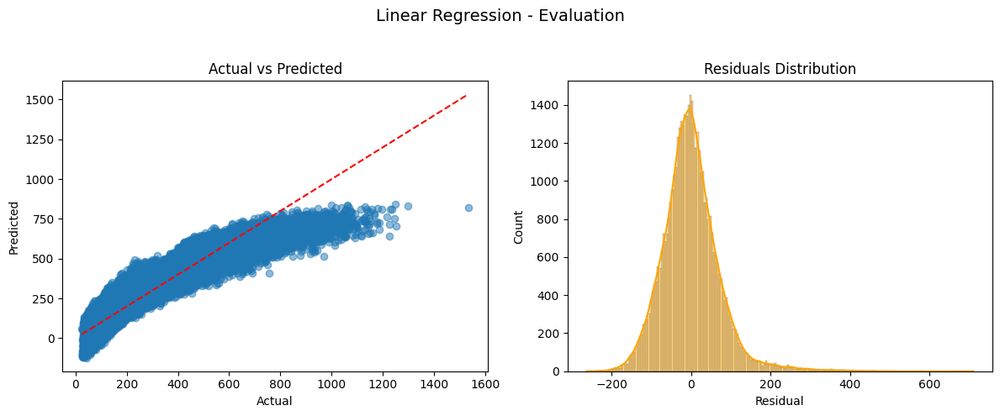

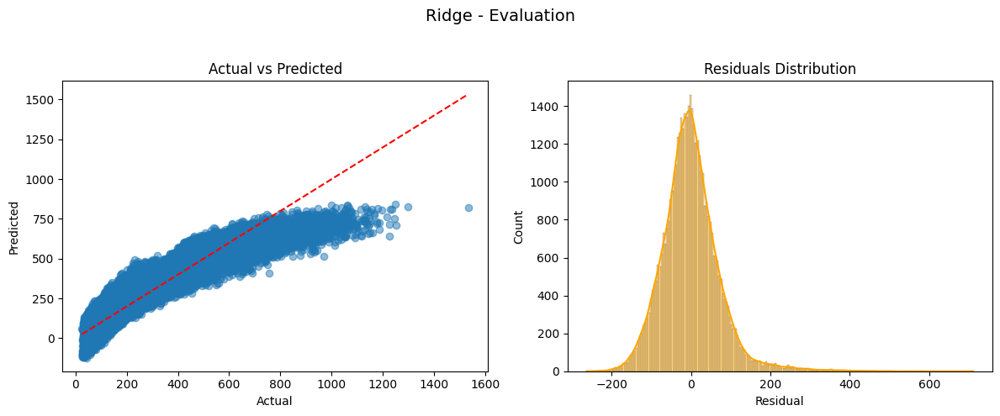

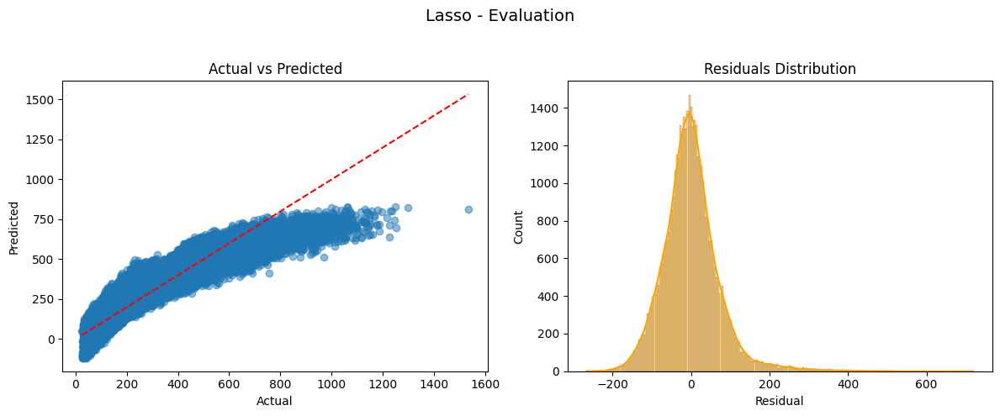

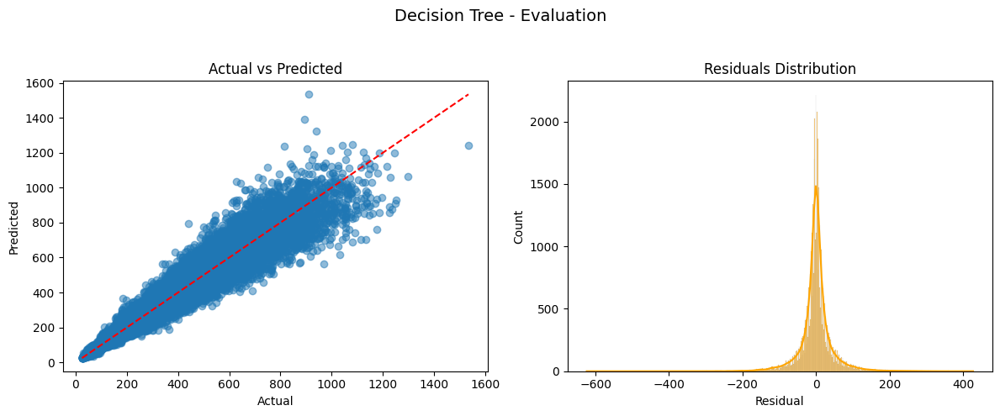

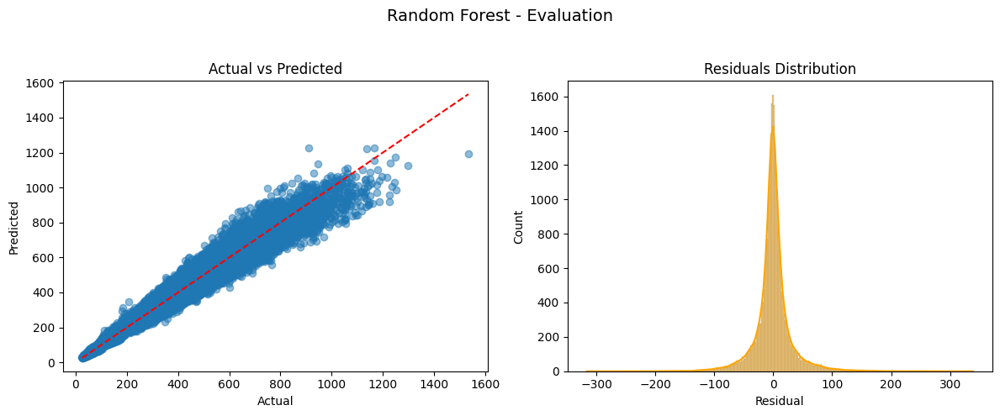

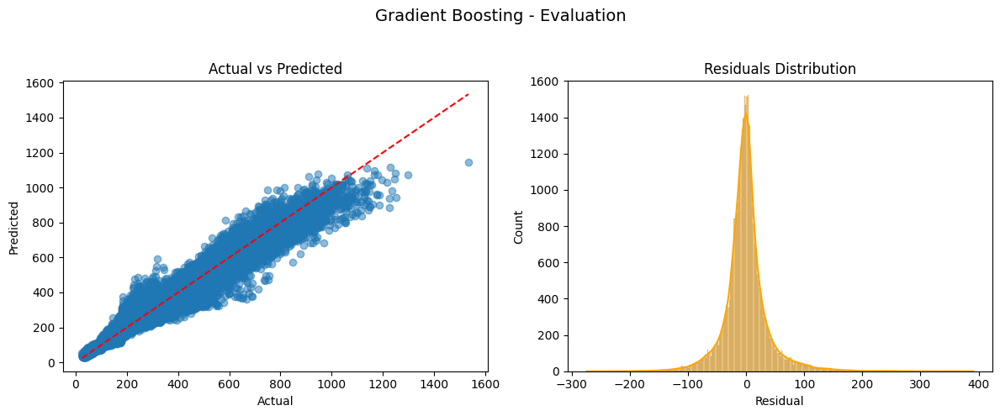

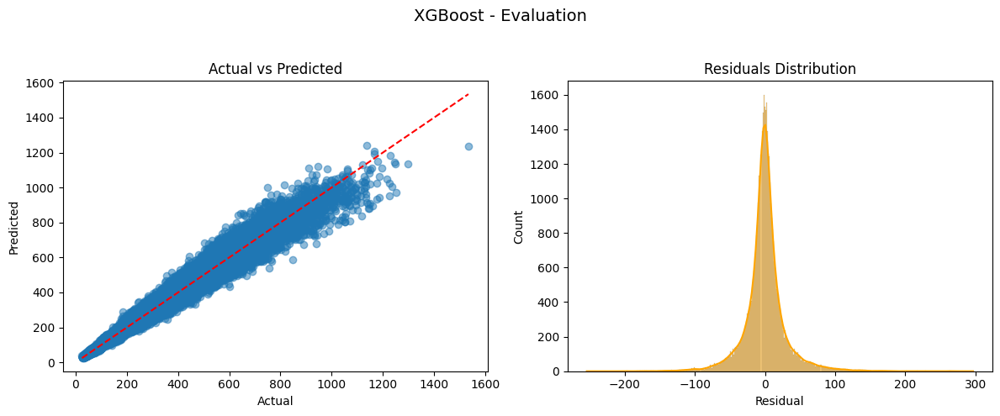

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2006
[LightGBM] [Info] Number of data points in the train set: 130200, number of used features: 24
[LightGBM] [Info] Start training from score 277.283187


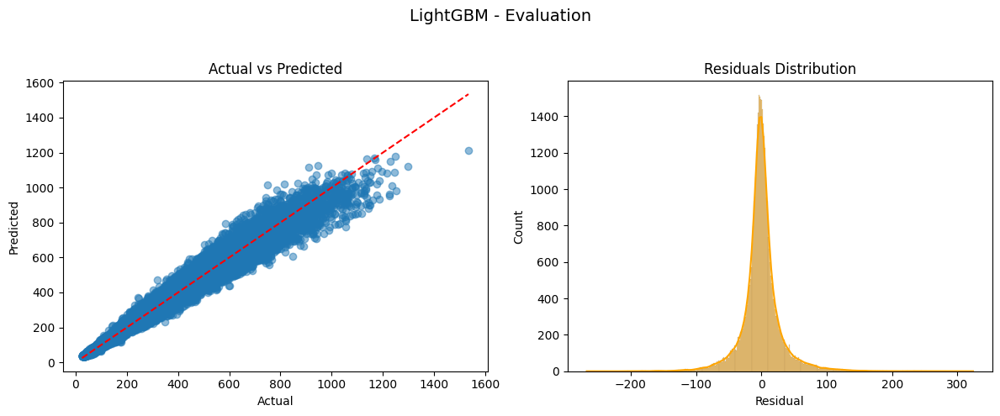

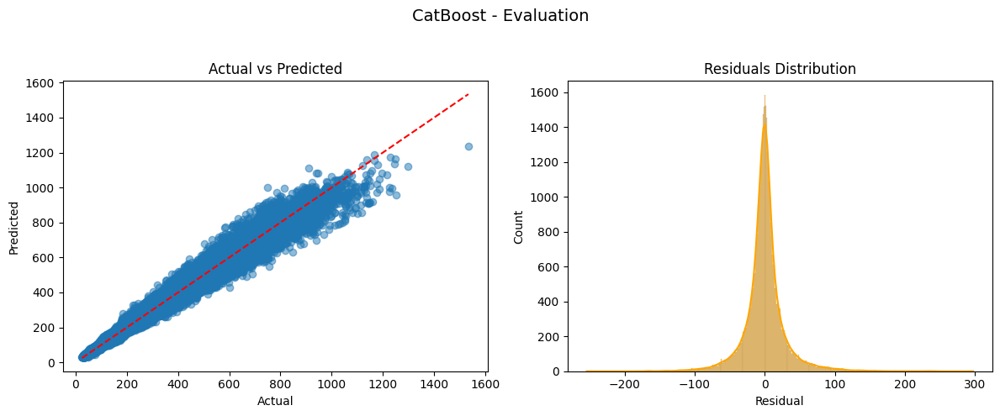

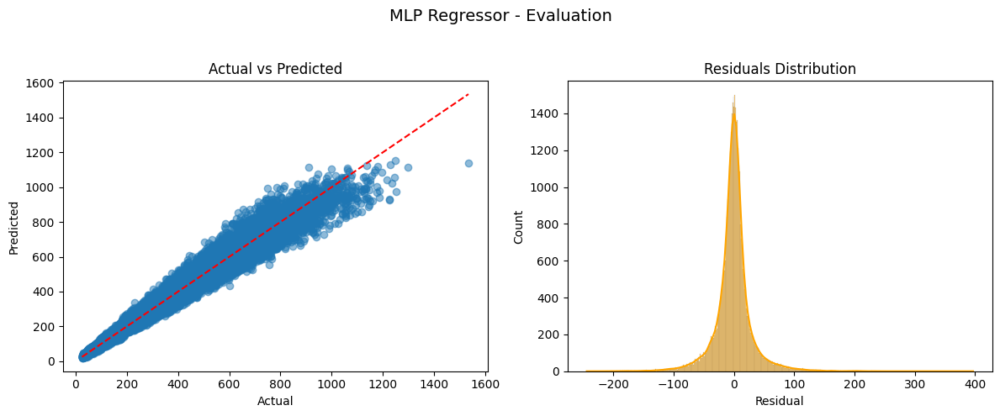

In [83]:
# Mendefinisikan model yang digunakan
models = {
    "Linear Regression": LinearRegression(),
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "XGBoost": xgb.XGBRegressor(),
    "LightGBM": lgb.LGBMRegressor(),
    "CatBoost": CatBoostRegressor(verbose=0),
    "MLP Regressor": MLPRegressor(max_iter=500)
}

# Menginisialisasi untuk menyimpan hasil
results = []

# Loop modeling + evaluation
for name, model in models.items():
    model.fit(X_train_encoded, y_train)
    y_pred = model.predict(X_test_encoded)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

    results.append({
        "Model": name,
        "RMSE": rmse,
        "MAE": mae,
        "MAPE (%)": mape,
        "R² Score": r2
    })

    # --- Visualization ---
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f"{name} - Evaluation", fontsize=14)

    # 1. Actual vs Predicted
    axs[0].scatter(y_test, y_pred, alpha=0.5)
    axs[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
    axs[0].set_xlabel("Actual")
    axs[0].set_ylabel("Predicted")
    axs[0].set_title("Actual vs Predicted")

    # 2. Residual Plot
    residuals = y_test - y_pred
    sns.histplot(residuals, kde=True, ax=axs[1], color='orange')
    axs[1].set_title("Residuals Distribution")
    axs[1].set_xlabel("Residual")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

In [84]:
# Hasil evaluasi
results_df = pd.DataFrame(results).sort_values("MAPE (%)")
results_df = results_df.round(2)
results_df

,Model,RMSE,MAE,MAPE (%),R² Score
8,CatBoost,29.40,18.24,6.46,0.98
4,Random Forest,31.47,19.05,6.48,0.97
6,XGBoost,29.98,18.77,6.67,0.98
7,LightGBM,30.58,19.09,6.86,0.98
9,MLP Regressor,30.72,19.17,6.90,0.98
3,Decision Tree,44.86,26.71,9.00,0.95
5,Gradient Boosting,37.97,24.44,9.45,0.96
2,Lasso,71.89,52.15,29.27,0.86
1,Ridge,71.57,52.55,29.65,0.86
0,Linear Regression,71.57,52.55,29.65,0.86


### Train vs Test Evaluation

In [85]:
# Mendefinisikan model yang digunakan
models = {
    "Linear Regression": LinearRegression(),
    "Ridge": Ridge(),
    "Lasso": Lasso(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "XGBoost": xgb.XGBRegressor(),
    "LightGBM": lgb.LGBMRegressor(),
    "CatBoost": CatBoostRegressor(verbose=0),
    "MLP Regressor": MLPRegressor(max_iter=500)
    }

results_train_test = []

for name, model in models.items():
    model.fit(X_train_encoded, y_train)

    # Predict
    y_pred_train = model.predict(X_train_encoded)
    y_pred_test = model.predict(X_test_encoded)

    # Train metrics
    train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
    train_mae = mean_absolute_error(y_train, y_pred_train)
    train_r2 = r2_score(y_train, y_pred_train)
    train_mape = np.mean(np.abs((y_train - y_pred_train) / y_train)) * 100

    # Test metrics
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
    test_mae = mean_absolute_error(y_test, y_pred_test)
    test_r2 = r2_score(y_test, y_pred_test)
    test_mape = np.mean(np.abs((y_test - y_pred_test) / y_test)) * 100

    results_train_test.append({
          "Model": name,
          "Train RMSE": train_rmse,
          "Test RMSE": test_rmse,
          "Train MAE": train_mae,
          "Test MAE": test_mae,
          "Train MAPE (%)": train_mape,
          "Test MAPE (%)": test_mape,
          "Train R²": train_r2,
          "Train R²": train_r2,
          "Test R²": test_r2
        })

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2006
[LightGBM] [Info] Number of data points in the train set: 130200, number of used features: 24
[LightGBM] [Info] Start training from score 277.283187


In [86]:
# Hasil evaluasi
results_train_test_df = pd.DataFrame(results_train_test).sort_values("Test MAPE (%)")
results_train_test_df = results_train_test_df.round(2)
results_train_test_df

,Model,Train RMSE,Test RMSE,Train MAE,Test MAE,Train MAPE (%),Test MAPE (%),Train R²,Test R²
8,CatBoost,27.07,29.40,17.22,18.24,6.21,6.46,0.98,0.98
4,Random Forest,11.77,31.48,7.07,19.04,2.40,6.48,1.00,0.97
6,XGBoost,26.69,29.98,17.18,18.77,6.28,6.67,0.98,0.98
9,MLP Regressor,30.15,30.63,18.78,19.03,6.72,6.83,0.98,0.98
7,LightGBM,29.42,30.58,18.66,19.09,6.75,6.86,0.98,0.98
3,Decision Tree,0.00,44.76,0.00,26.70,0.00,8.99,1.00,0.95
5,Gradient Boosting,37.65,37.97,24.36,24.44,9.43,9.45,0.96,0.96
2,Lasso,71.54,71.89,52.03,52.15,29.37,29.27,0.87,0.86
1,Ridge,71.23,71.57,52.47,52.55,29.76,29.65,0.87,0.86
0,Linear Regression,71.24,71.57,52.47,52.55,29.76,29.65,0.87,0.86


## **Hyperparameter**

### XGBoost

In [87]:
# Menginisiasi model
xgb_rgs = xgb.XGBRegressor(random_state=42)

In [88]:
# Menentukan parameter tuning
parameters = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2]
}

# Hyperparameter tuning dengan GridSearch
xgb_rgs_gridcv = GridSearchCV(xgb_rgs, parameters, cv=5, scoring="neg_mean_squared_error", n_jobs=-1)

# Training model
xgb_rgs_gridcv.fit(X_train_encoded, y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, feature_weights=None,
                                    gamma=None, grow_policy=None,
                                    importance_type=None,
                                    interaction_constraints=None...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 200]},
             scoring='neg_mean_squared_error')

In [89]:
# Prediksi
y_pred = xgb_rgs_gridcv.best_estimator_.predict(X_test_encoded)

In [90]:
# Evaluasi model
rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred))
mae_xgb = mean_absolute_error(y_test, y_pred)
r2_xgb = r2_score(y_test, y_pred)
mape_xgb = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

In [91]:
from tabulate import tabulate

results = [
    ['RMSE', f'{rmse_xgb:.2f}'],
    ['MAE', f'{mae_xgb:.2f}'],
    ['R² Score', f'{r2_xgb:.2f}'],
    ['MAPE (%)', f'{mape_xgb:.2f}']
]

print(tabulate(results, headers=['Metric', 'Value'], tablefmt='fancy_grid'))

╒══════════╤═════════╕
│ Metric   │   Value │
╞══════════╪═════════╡
│ RMSE     │   28.23 │
├──────────┼─────────┤
│ MAE      │   17.59 │
├──────────┼─────────┤
│ R² Score │    0.98 │
├──────────┼─────────┤
│ MAPE (%) │    6.27 │
╘══════════╧═════════╛


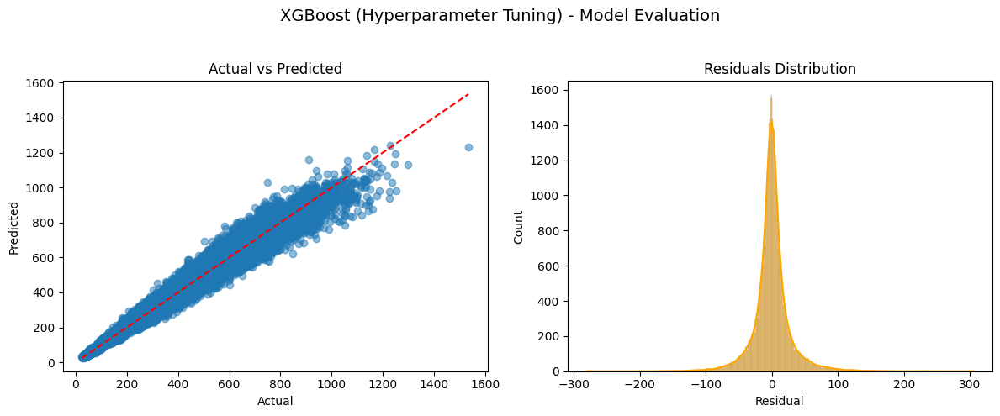

In [92]:
# --- Visualization ---
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle("XGBoost (Hyperparameter Tuning) - Model Evaluation", fontsize=14)

# 1. Actual vs Predicted
axs[0].scatter(y_test, y_pred, alpha=0.5)
axs[0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
axs[0].set_xlabel("Actual")
axs[0].set_ylabel("Predicted")
axs[0].set_title("Actual vs Predicted")
axs[0].grid(False)

# 2. Residual Plot
residuals = y_test - y_pred
sns.histplot(residuals, kde=True, ax=axs[1], color='orange')
axs[1].set_title("Residuals Distribution")
axs[1].set_xlabel("Residual")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.grid(False)
plt.show()

#### Train Evaluation

In [93]:
y_pred_train = xgb_rgs_gridcv.best_estimator_.predict(X_train_encoded)

# Evaluasi model
rmse_xgb_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
mae_xgb_train = mean_absolute_error(y_train, y_pred_train)
r2_xgb_train = r2_score(y_train, y_pred_train)
mape_xgb_train = np.mean(np.abs((y_train - y_pred_train) / y_train)) * 100

In [94]:
results_train = [
    ['RMSE', f'{rmse_xgb_train:.2f}'],
    ['MAE', f'{mae_xgb_train:.2f}'],
    ['R² Score', f'{r2_xgb_train:.2f}'],
    ['MAPE (%)', f'{mape_xgb_train:.2f}']
]

print(tabulate(results_train, headers=['Metric', 'Value'], tablefmt='fancy_grid'))

╒══════════╤═════════╕
│ Metric   │   Value │
╞══════════╪═════════╡
│ RMSE     │   21.86 │
├──────────┼─────────┤
│ MAE      │   14.32 │
├──────────┼─────────┤
│ R² Score │    0.99 │
├──────────┼─────────┤
│ MAPE (%) │    5.44 │
╘══════════╧═════════╛


## **Model Diagnostic**

In [95]:
best_model = xgb_rgs_gridcv.best_estimator_

In [96]:
# Membuat explainer object dari model XGBoost terbaik hasil tuning
xgb_exp = dx.Explainer(xgb_rgs_gridcv.best_estimator_, X_train_encoded, y_train, label="XGBoost Interpretation")

Preparation of a new explainer is initiated

  -> data              : 130200 rows 24 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 130200 values
  -> model_class       : xgboost.sklearn.XGBRegressor (default)
  -> label             : XGBoost Interpretation
  -> predict function  : <function yhat_default at 0x000001DDAFCA2AC0> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 24.7, mean = 2.77e+02, max = 1.54e+03
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.56e+02, mean = 0.000817, max = 1.89e+02
  -> model_info        : package xgboost

A new explainer has been created!


In [ ]:
# Menampilkan feature importance
#xgb_exp.model_parts().plot()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

In [ ]:
# Menampilkan Partial Dependence Plot (PDP)
#xgb_exp.model_profile().plot()

Calculating ceteris paribus: 100%|██████████| 24/24 [00:03<00:00,  6.98it/s]


## Save Model and Asset

In [98]:
import joblib

# Simpan model terbaik dari hasil GridSearchCV
joblib.dump(xgb_rgs_gridcv.best_estimator_, 'model_xgb.pkl')

# Simpan scaler yang sudah fit dengan data training
joblib.dump(scaler, 'scaler.pkl')

# Simpan urutan fitur yang digunakan model
joblib.dump(X_train_encoded.columns.tolist(), 'feature_columns.pkl')

# Simpan hasil target encoding untuk brand dan product
joblib.dump(brand_mean, 'brand_mean.pkl')
joblib.dump(product_mean, 'product_mean.pkl')

print("✅ Semua model dan asset berhasil disimpan.")


✅ Semua model dan asset berhasil disimpan.


In [ ]:
numeric_cols = [col for col in X_train_encoded.select_dtypes(include=['int64', 'float64']).columns
                if not any(col.startswith(prefix) for prefix in exclude_prefix)]

In [111]:
joblib.dump(numeric_cols, 'numeric_cols.pkl')

['numeric_cols.pkl']

## **Optimal Markdown**

In [99]:
def simulate_optimal_discount_per_price(product_name, brand, season,
                                        original_df, model, encoder_dict,
                                        scaler, features_model, numeric_cols):

    # Filter subset sesuai dengan kombinasi produk
    subset = original_df[
        (original_df['Product_Name'] == product_name) &
        (original_df['Brand'] == brand) &
        (original_df['Season'] == season)
    ].copy()

    if subset.empty:
        raise ValueError("Data untuk kombinasi tersebut tidak ditemukan.")

    results = [] # Menginisiasi tempat penyimpanan hasil

    for price in subset['Original_Price'].unique():
        subset_price = subset[subset['Original_Price'] == price].copy()
        subset_price['Final_Price'] = subset_price['Original_Price'] * (1 - subset_price['Markdown'])
        subset_price['Revenue'] = subset_price['Final_Price'] * subset_price['Sales_After']

        # Menghitung Baseline (tanpa markdown)
        baseline_row = subset_price[np.isclose(subset_price['Final_Price'], subset_price['Original_Price'])]

        if not baseline_row.empty:
            revenue_baseline = (baseline_row['Final_Price'] * baseline_row['Sales_After']).values[0]
            sales_baseline = baseline_row['Sales_After'].values[0]
        else:
            revenue_baseline = subset_price['Revenue'].mean()
            sales_baseline = subset_price['Sales_After'].mean()

        # Encoding
        subset_price['Brand_encoded'] = subset_price['Brand'].map(encoder_dict['brand_mean'])
        subset_price['Product_Name_encoded'] = subset_price['Product_Name'].map(encoder_dict['product_mean'])
        subset_price = pd.get_dummies(subset_price, columns=['Category', 'Season', 'Promotion_Type'], drop_first=True)

        # Memastikan semua fitur tersedia
        for col in features_model:
            if col not in subset_price.columns:
                subset_price[col] = 0
        # Scaling
        df_sim = subset_price[features_model].copy()
        df_sim[numeric_cols] = scaler.transform(df_sim[numeric_cols])

        # Melakukan prediksi
        subset_price['Predicted_Sales'] = model.predict(df_sim)
        subset_price['Simulated_Revenue'] = subset_price['Final_Price'] * subset_price['Predicted_Sales']

        # Mengambil baris dengan revenue tertinggi
        best_row = subset_price.loc[subset_price['Simulated_Revenue'].idxmax()]

        results.append({
            'Original_Price': price,
            'Markdown_Optimal': best_row['Markdown'],
            'Final_Price': best_row['Final_Price'],
            'Predicted_Sales': best_row['Predicted_Sales'],
            'Simulated_Revenue': best_row['Simulated_Revenue'],
            'Revenue_Before_Optimization': revenue_baseline,
            'Sales_Before_Optimization': sales_baseline
        })

    # Membuat dataframe hasil
    df_result = pd.DataFrame(results)
    df_result['Revenue_Improvement'] = df_result['Simulated_Revenue'] - df_result['Revenue_Before_Optimization']
    df_result['Revenue_Improvement_Percentage'] = (df_result['Revenue_Improvement'] / df_result['Revenue_Before_Optimization']) * 100
    df_result['Sales_Improvement'] = df_result['Predicted_Sales'] - df_result['Sales_Before_Optimization']
    df_result['Sales_Improvement_Percentage'] = (df_result['Sales_Improvement'] / df_result['Sales_Before_Optimization']) * 100

    combo_label = f"{product_name} | {brand} | {season}"

    # Plot 1: Revenue Before vs After
    plt.figure(figsize=(14, 8))
    sns.barplot(data=df_result, x='Original_Price', y='Revenue_Before_Optimization', color='gray', label='Before Optimization')
    sns.barplot(data=df_result, x='Original_Price', y='Simulated_Revenue', color='green', label='After Optimization')
    plt.title(f'Revenue Sebelum & Setelah Optimasi Markdown\n({combo_label})', pad=20)
    plt.xlabel('Original Price', labelpad=15)
    plt.ylabel('Revenue', labelpad=10)
    plt.xticks(rotation=90)
    plt.legend()
    for patch, label in zip(plt.gca().patches[len(df_result):], df_result['Markdown_Optimal']):
        x = patch.get_x() + patch.get_width() / 2
        y = patch.get_height()
        plt.text(x, y + 0.012 * df_result['Simulated_Revenue'].max(), f"{int(label*100)}%",
                 ha='center', va='bottom', fontsize=9, rotation=90)
    plt.tight_layout()
    plt.show()


    # Plot 2: Revenue Improvement (%)
    plt.figure(figsize=(14, 8))
    sns.barplot(data=df_result, x='Original_Price', y='Revenue_Improvement_Percentage', color='blue')
    plt.title(f'Peningkatan Revenue (%) Setelah Markdown Optimal\n({combo_label})', pad=20)
    plt.xlabel('Original Price', labelpad=15)
    plt.ylabel('Revenue Improvement (%)', labelpad=10)
    plt.xticks(rotation=90)
    for patch, label in zip(plt.gca().patches, df_result['Markdown_Optimal']):
        x = patch.get_x() + patch.get_width() / 2
        y = patch.get_height()
        plt.text(x, y + 0.012 * df_result['Revenue_Improvement_Percentage'].max(), f"{int(label*100)}%",
                 ha='center', va='bottom', fontsize=9, rotation=90)
    plt.tight_layout()
    plt.show()

    # Plot 3: Sales Before vs After
    plt.figure(figsize=(14, 8))
    sns.barplot(data=df_result, x='Original_Price', y='Sales_Before_Optimization', color='gray', label='Before Optimization')
    sns.barplot(data=df_result, x='Original_Price', y='Predicted_Sales', color='orange', label='After Optimization')
    plt.title(f'Penjualan Sebelum & Setelah Optimasi Markdown\n({combo_label})', pad=20)
    plt.xlabel('Original Price', labelpad=15)
    plt.ylabel('Sales', labelpad=10)
    plt.xticks(rotation=90)
    plt.legend()
    for patch, label in zip(plt.gca().patches[len(df_result):], df_result['Markdown_Optimal']):
        x = patch.get_x() + patch.get_width() / 2
        y = patch.get_height()
        plt.text(x, y + 0.012 * df_result['Predicted_Sales'].max(), f"{int(label*100)}%",
                 ha='center', va='bottom', fontsize=9, rotation=90)
    plt.tight_layout()
    plt.show()

    return df_result

In [100]:
def get_simulation_details_for_price(df_result, sim_detail, price_val):

    # Mengecek apakah price_val tersedia dalam data
    if price_val not in df_result['Original_Price'].values:
        print(f"Tidak ditemukan data simulasi untuk Original Price = {price_val}")
        return

    # Mengambil baris hasil simulasi
    result = df_result[df_result['Original_Price'] == price_val].iloc[0]

    # Memformat output
    output = {
        'Original Price': f"₣  {result['Original_Price']:.2f}",
        'Markdown Optimal': f"{result['Markdown_Optimal'] * 100:.0f}%",
        'Discounted Price': f"₣  {result['Final_Price']:.2f}",
        'Predicted Sales': f"{int(result['Predicted_Sales'])} unit",
        'Predicted Revenue': f"₣  {result['Simulated_Revenue']:.2f}",
        'Revenue Improvement': f"₣  {result['Revenue_Improvement']:.2f} ({result['Revenue_Improvement_Percentage']:.0f}%)"
    }

    # Mencetak hasil simulasi
    for key, value in output.items():
        print(f"{key:<20}: {value}")

    # Mengambil data simulasi detail berdasarkan original price
    subset = sim_detail[sim_detail['Original_Price_Value'] == price_val]

    # Membuat plot
    if not subset.empty:
        fig, ax1 = plt.subplots(figsize=(10, 6))

        # Axis 1: Predicted Sales
        color1 = 'tab:blue'
        ax1.set_xlabel('Markdown')
        ax1.set_ylabel('Predicted Sales', color=color1)
        sns.lineplot(data=subset, x='Markdown', y='Predicted_Sales', marker='o', ax=ax1, label='Predicted Sales', color=color1)
        ax1.tick_params(axis='y', labelcolor=color1)
        ax1.grid(False)

        # Axis 2: Simulated Revenue
        ax2 = ax1.twinx()
        color2 = 'tab:green'
        ax2.set_ylabel('Simulated Revenue', color=color2)
        sns.lineplot(data=subset, x='Markdown', y='Simulated_Revenue', marker='o', ax=ax2, label='Simulated Revenue', color=color2)
        ax2.tick_params(axis='y', labelcolor=color2)
        ax2.grid(False)

        # Garis optimal markdown
        ax1.axvline(x=result['Markdown_Optimal'], linestyle='--', color='red', label='Optimal Markdown')

        # Legend
        ax1.legend(loc='upper right', bbox_to_anchor=(1, 1))
        ax2.legend(loc='lower right', bbox_to_anchor=(1, 0.80))

        # Title
        plt.title(f'Respons Sales dan Revenue terhadap Markdown\n(Original Price = {price_val})')
        plt.tight_layout()
        plt.show()
    else:
        print(f"Tidak ditemukan data simulasi detail untuk Original Price = {price_val}")

    return output


In [101]:
def simulate_detail_per_price(product_name, brand, season, original_df, model, encoder_dict,
                              scaler, features_model, numeric_cols):
    # Mengambil subset data berdasarkan kombinasi nama produk, brand, dan musim
    subset = original_df[
        (original_df['Product_Name'] == product_name) &
        (original_df['Brand'] == brand) &
        (original_df['Season'] == season)
    ].copy()

    if subset.empty:
        raise ValueError("Data untuk kombinasi tersebut tidak ditemukan.")

    all_details = [] # Menginisiasi pemyimpanan hasil simulasi

    # Iterasi setiap nilai original price yang unik
    for price in subset['Original_Price'].unique():
        base_subset = subset[subset['Original_Price'] == price].copy()

        # Iterasi setiap tingkat markdown yang tersedia untuk harga tersebut
        for markdown in sorted(base_subset['Markdown'].unique()):
            row = base_subset[base_subset['Markdown'] == markdown].copy()
            if row.empty:
                continue
            # Menghitung harga akhir setelah diskon
            row['Final_Price'] = row['Original_Price'] * (1 - row['Markdown'])

            # Encoding
            row['Brand_encoded'] = row['Brand'].map(encoder_dict['brand_mean'])
            row['Product_Name_encoded'] = row['Product_Name'].map(encoder_dict['product_mean'])
            row = pd.get_dummies(row, columns=['Category', 'Season', 'Promotion_Type'], drop_first=True)

            # Menambahkan kolom dummy yang belum ada (karena mungkin tidak muncul dalam subset)
            for col in features_model:
                if col not in row.columns:
                    row[col] = 0

            # Mengambil fitur yang diperlukan model
            df_sim = row[features_model].copy()

            df_sim[numeric_cols] = scaler.transform(df_sim[numeric_cols]) #Scaling
            row['Predicted_Sales'] = model.predict(df_sim) # Memprediksi Sales
            row['Simulated_Revenue'] = row['Final_Price'] * row['Predicted_Sales'] # Menghitung revenue
            row['Original_Price_Value'] = price
            row['Markdown_Value'] = markdown

            # Menyimpan hasil ke dalam list
            all_details.append(row[['Original_Price_Value', 'Markdown', 'Predicted_Sales', 'Simulated_Revenue']])

    df_detail = pd.concat(all_details, ignore_index=True)
    return df_detail


### Combination A

In [102]:
sim_detail = simulate_detail_per_price(
    product_name='Pore Minimizer',
    brand='BrandA',
    season='Spring',
    original_df=df_melted,
    model=best_model,
    encoder_dict={
        'brand_mean': brand_mean,
        'product_mean': product_mean
    },
    scaler=scaler,
    features_model=features_model,
    numeric_cols=numeric_cols
)

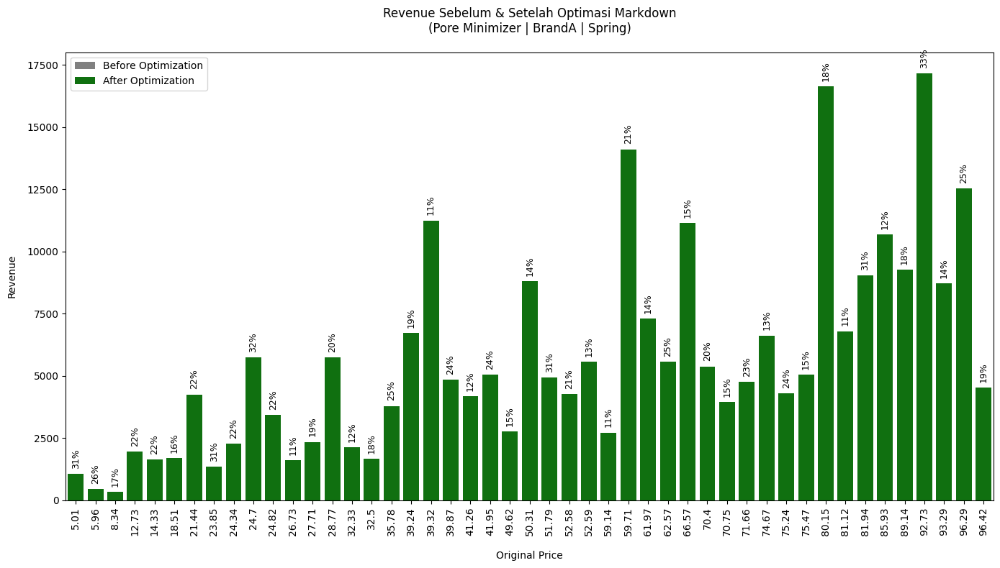

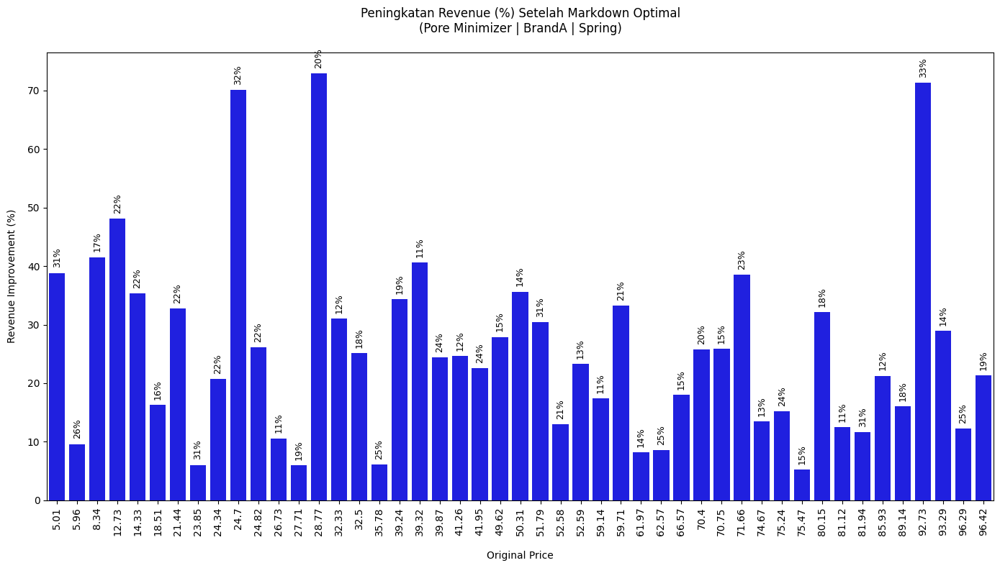

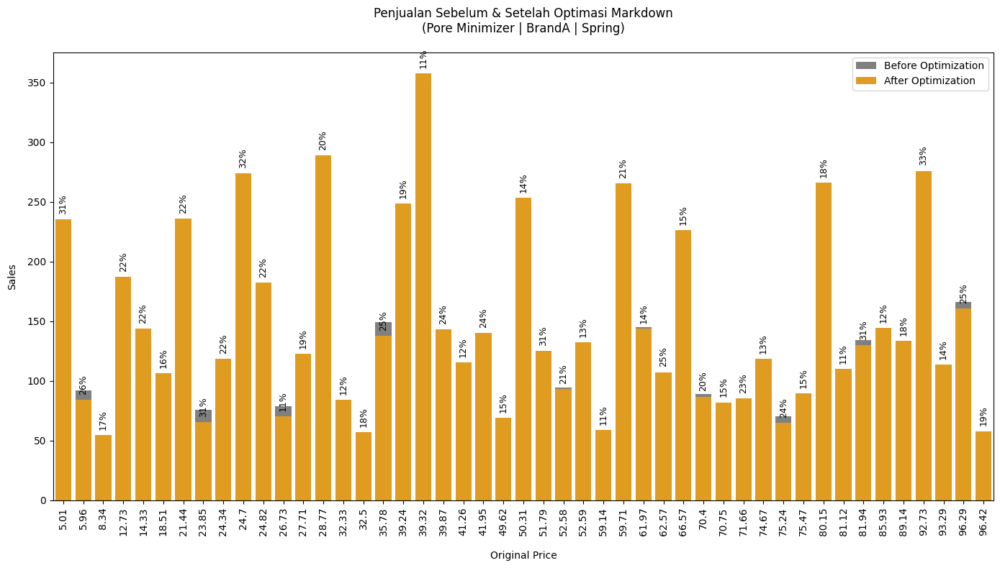

In [103]:
optimal_discount = simulate_optimal_discount_per_price(
    product_name='Pore Minimizer',
    brand='BrandA',
    season='Spring',
    original_df=df_melted,
    model=best_model,
    encoder_dict={
        'brand_mean': brand_mean,
        'product_mean': product_mean
    },
    scaler=scaler,
    features_model=features_model,
    numeric_cols=numeric_cols
)

Original Price      : ₣  92.73
Markdown Optimal    : 33%
Discounted Price    : ₣  62.13
Predicted Sales     : 276 unit
Predicted Revenue   : ₣  17155.56
Revenue Improvement : ₣  7140.26 (71%)


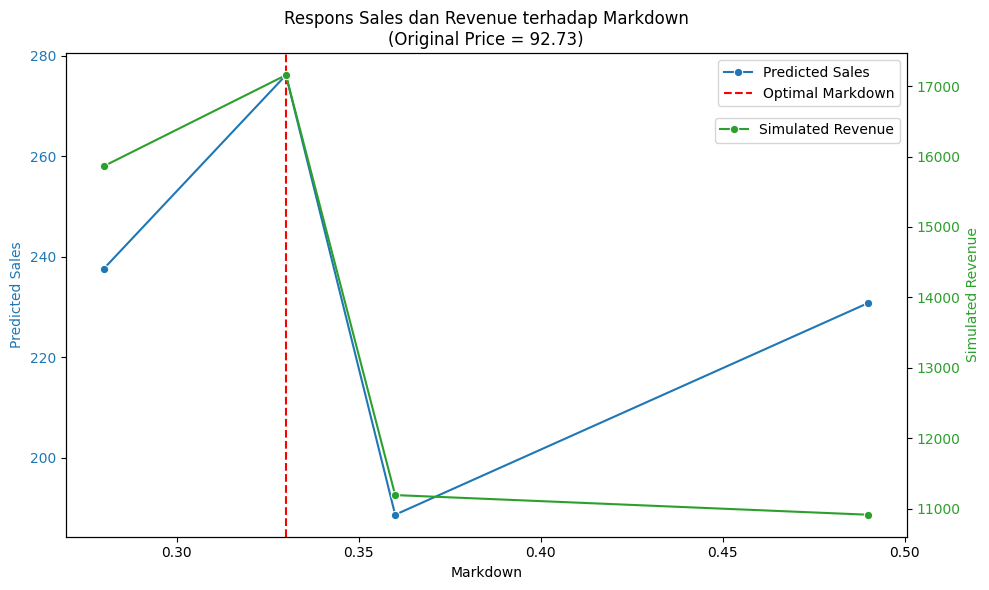

In [104]:
detail = get_simulation_details_for_price(optimal_discount, sim_detail, price_val=92.73)

### Top Combination

In [105]:
top1_detail = simulate_detail_per_price(
    product_name='Hand Cream',
    brand='BrandA',
    season='Spring',
    original_df=df_melted,
    model=best_model,
    encoder_dict={
        'brand_mean': brand_mean,
        'product_mean': product_mean
    },
    scaler=scaler,
    features_model=features_model,
    numeric_cols=numeric_cols
)

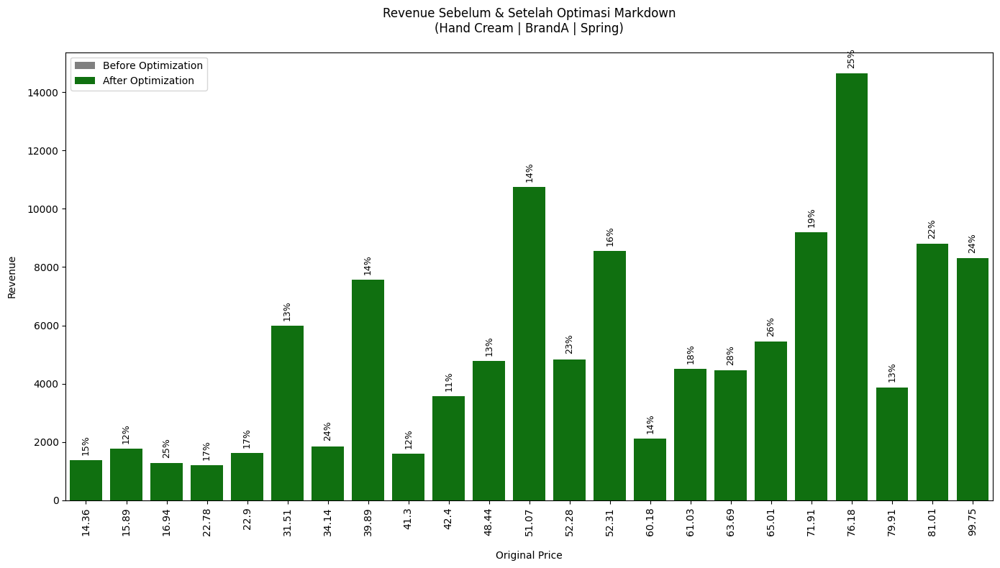

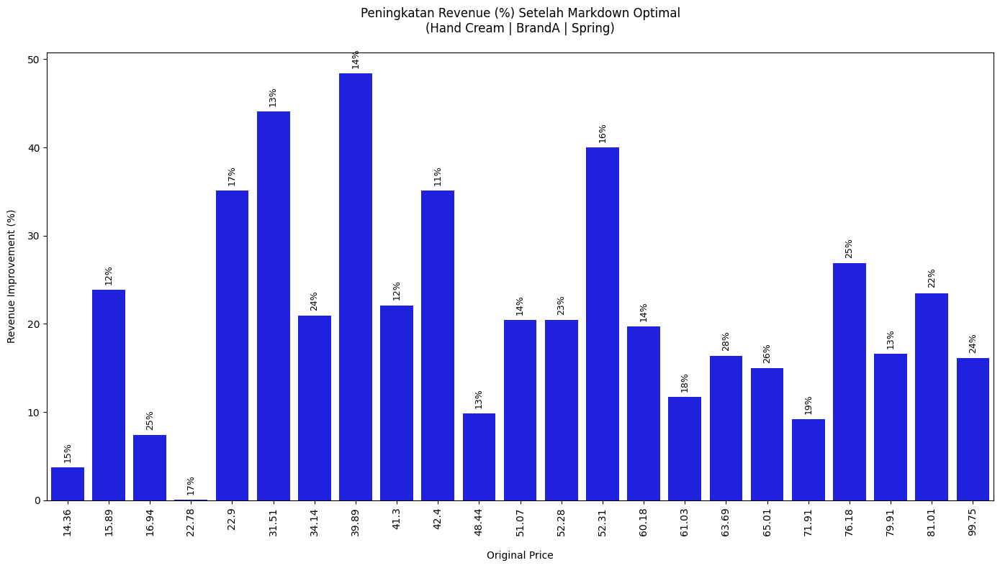

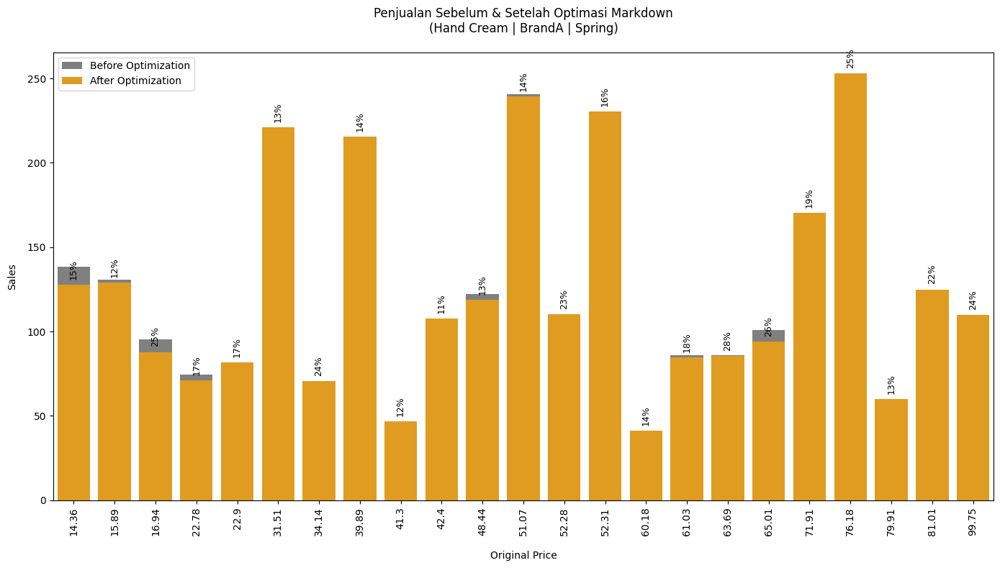

In [106]:
top1_optimal_discount = simulate_optimal_discount_per_price(
    product_name='Hand Cream',
    brand='BrandA',
    season='Spring',
    original_df=df_melted,
    model=best_model,
    encoder_dict={
        'brand_mean': brand_mean,
        'product_mean': product_mean
    },
    scaler=scaler,
    features_model=features_model,
    numeric_cols=numeric_cols
)

Original Price      : ₣  76.18
Markdown Optimal    : 24%
Discounted Price    : ₣  57.90
Predicted Sales     : 252 unit
Predicted Revenue   : ₣  14641.46
Revenue Improvement : ₣  3102.86 (27%)


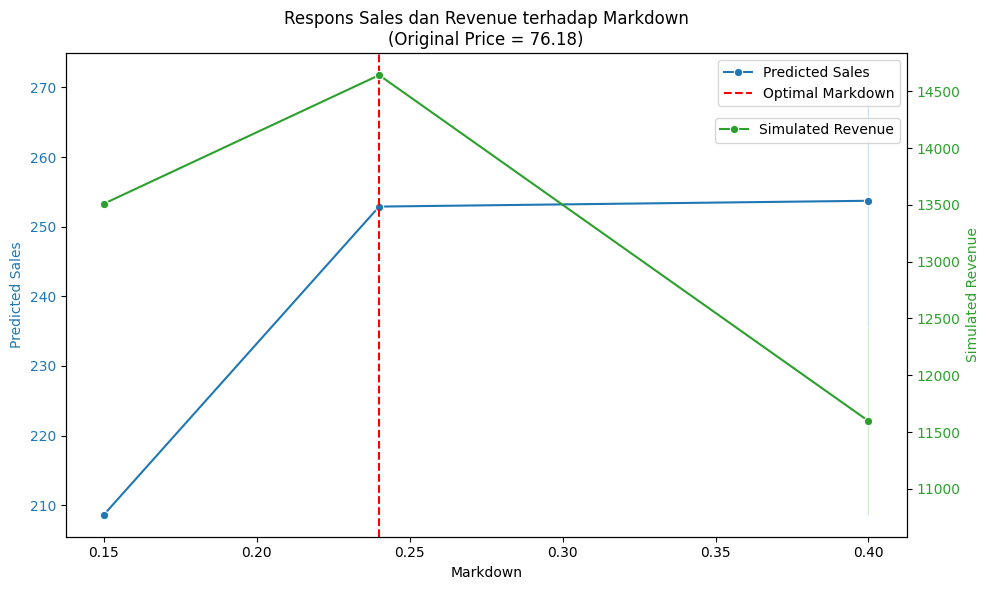

In [107]:
top1_details = get_simulation_details_for_price(top1_optimal_discount, top1_detail, price_val=76.18)

## end. Thank You!